# LGS Metadata Statistics and Analysis
### Created by: Steve Robinson

This notebook has been designed to process and display statistis and analysis of galactic center data taken using the laser guide star adaptive optics (LGS-AO) system on the Keck II telescope.  After a new epoch or any additional data becomes available and is downloaded, and the lgs_metadata_compiler.py script has been run to update or repopulate the lgs_metadata.fits file, each cell of this notebook can be run sequentially, top to bottom, to update any and all figures associated with this analysis.

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Preamble

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import os
import datetime
from astropy.time import Time, TimezoneInfo
from astropy.table import Table, vstack
from astropy import units as u, constants as c
from datetime import datetime, timezone
import pytz
import time
import glob
import urllib
from importlib import reload
from astropy.io import fits
from matplotlib import rcParams
from matplotlib.axes import Axes

# Plot style
rcParams["text.usetex"]= True
rcParams["font.family"]= "serif"
rcParams["font.serif"]= []          
rcParams["font.sans-serif"]= []
rcParams["font.monospace"]= []
rcParams["axes.labelsize"]= 24              
rcParams["font.size"]= 24
rcParams["axes.titlesize"]= 24              
rcParams["legend.fontsize"]= 16             
rcParams["xtick.labelsize"]= 20
rcParams["ytick.labelsize"]= 20
rcParams["legend.fontsize"]= 20
rcParams["axes.linewidth"]  = 2 
rcParams["xtick.major.size"]  = 5
rcParams["ytick.major.size"]  = 5 
rcParams["xtick.major.width"]  = 2
rcParams["ytick.major.width"]  = 2
rcParams['figure.figsize'] = (16,10)

In [3]:
data_dir = ""
plot_dir = "../work/Keck_Performance/plots/steve_plots/"

In [4]:
%%html
<style>
body {font-family: "Courier", sans-serif;}
</style>

### If you would like to update the metadata.fits file, simply uncomment the lines in the cell below and run it prior to running the rest of the cells in this notebook.

In [6]:
import lgs_metadata_compiler as lmc
lmc.update()

04jullgs
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727
date string: 20040726
date string: 20040727


KeyboardInterrupt: 

# Load Datatable, Convert to Pandas df, Trim Bad Data

In [6]:
file = '/g/lu/data/gc/lgs_metadata.fits' # replaced with the correct file - Emily
# file = '/Users/stevenrobinson/Desktop/SCHOOL/Research/lgs_metadata2.fits'
datatable = Table.read(file, format = 'fits')
df = datatable.to_pandas()

bad = []
for i, row in df.iterrows():
    if row['strehl'] == -1:
        bad.append(i)
df = df.drop(df.index[bad])

# Statistics

### Histograms of time between measurements

In [7]:
# This gives us one second as decimal of a day
dec_sec = 1 / (24 * 60 * 60)

/opt/anaconda3/envs/astroconda/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/anaconda3/envs/astroconda/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


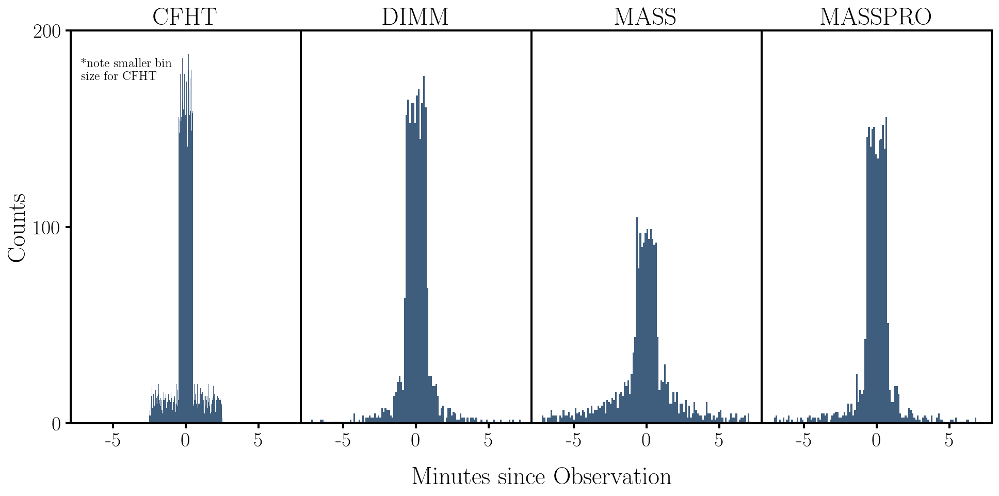

In [8]:
fig, ax = plt.subplots(1, 4, figsize = (16,7))
plt.subplots_adjust(wspace = 0)

color = '#3F5D7D'

x1 = df['cfht_delta_t']
x2 = df['DIMM_delta_t']
x3 = df['MASS_delta_t']
x4 = df['MASSPRO_delta_t']

ax[0].hist(x1, range = (-0.005,0.005), bins = 400, label = 'CFHT', color = color)
ax[0].set_ylabel('Counts')
ax[0].locator_params(axis='y', nbins=2)
ax[0].set_title('CFHT')
ax[0].set_ylim(0,200)
ax[0].text(-0.005,175, '*note smaller bin \n  size for CFHT', fontsize = 12)

ax[1].hist(x2, range = (-0.005,0.005), bins = 120, label = 'DIMM', color = color)
ax[1].set_xlabel('Minutes since Observation')
ax[1].xaxis.set_label_coords(1.05,-0.11)
ax[1].locator_params(axis='y', nbins=2)
ax[1].set_title('DIMM')
ax[1].set_ylim(0,200)
ax[1].set_yticks([])

ax[2].hist(x3, range = (-0.005,0.005), bins = 120, label = 'MASS', color = color)
ax[2].locator_params(axis='y', nbins=2)
ax[2].set_title('MASS')
ax[2].set_ylim(0,200)
ax[2].set_yticks([])

ax[3].hist(x4, range = (-0.005,0.005), bins = 120, label = 'MASSPRO', color = color)
ax[3].locator_params(axis='y', nbins=2)
ax[3].set_title('MASSPRO')
ax[3].set_ylim(0,200)
ax[3].set_yticks([])

for i in range(4):
    ax[i].set_xticks([-0.00347222,0,0.00347222])
    ax[i].set_xticklabels(['-5', '0', '5'])

#plt.savefig('delta_t_hists.pdf', format='pdf', bbox_inches='tight')
#plt.savefig(plot_dir+'delta_t_hists.png', bbox_inches='tight')
plt.show()

### Barplots of number of measurements within certain time thresholds

In [9]:
def less(array, num = 1):
    return sum(np.abs(i) < dec_sec*num for i in array)

cfht = df['cfht_delta_t']
dimm = df['DIMM_delta_t']
mass = df['MASS_delta_t']
masspro = df['MASSPRO_delta_t']

data = [[len(cfht), len(dimm), len(mass), len(masspro)],
        [less(cfht,300), less(dimm,300), less(mass,300), less(masspro,300)],
        [less(cfht,180), less(dimm,180), less(mass,180), less(masspro,180)],
        [less(cfht,60), less(dimm,60), less(mass,60), less(masspro,60)],
        [less(cfht,30), less(dimm,30), less(mass,30), less(masspro,30)]]

<Figure size 1152x648 with 0 Axes>

In [ ]:
columns = ['CFHT', 'DIMM', 'MASS', 'MASSPRO']
rows = ['Total', 'w/i 5min', 'w/i 3min', 'w/i 1min', 'w/i 30sec',]

colors = plt.cm.GnBu(np.linspace(0.5, 1, len(rows)))
n_rows = len(data)

index = np.arange(len(columns)) + 0.3
bar_width = 0.4

plt.figure(figsize = (16,9))
# Plot bars and create text labels for the table
cell_text = []
for row in range(n_rows):
    plt.bar(index, data[row], bar_width, color=colors[row])
    cell_text.append(['%1.1f' % (x) for x in data[row]])

# Add a table at the bottom of the axes
the_table = plt.table(cellText=cell_text, rowLabels = rows, rowColours = colors, colLabels = columns, loc = 'bottom')
the_table.scale(1,3)
plt.subplots_adjust(left = 0.3, bottom = 0.3)
plt.xticks([])

#plt.savefig('bars.pdf', format = 'pdf')
#plt.savefig(plot_dir+'bars.png', bbox_inches='tight')
plt.show()

# Analyis

### Comparing seeing parameters to one another

In [ ]:
fig, ax = plt.subplots(2,2, figsize = (10,10))
plt.subplots_adjust(hspace = 0, wspace = 0)

model = np.linspace(0,1,100)

ax1 = ax[0,0]
ax2 = ax[0,1]
ax3 = ax[1,0]
ax4 = ax[1,1].axis('off')

# Uncommenting the additional ax.scatter calls below will colorize based on delta t
ax1.scatter(df['DIMM'], df['MASS'], s = 4, c = 'k')
# ax1.scatter(df['DIMM'], df['MASS'], s = 4, c = np.abs(df['DIMM_mjd'] - df['MASS_mjd']), cmap = 'viridis_r')
ax1.plot(model, model, color = 'k', linestyle = '--')
ax1.set_xlim(0,1)
ax1.set_ylim(0,1)
ax1.set_xticks([])
ax1.set_ylabel('MASS [arcsec]')

ax2.scatter(df['MASSPRO'], df['MASS'], s = 4, c = 'k')
# ax2.scatter(df['MASSPRO'], df['MASS'], s = 4, c = np.abs(df['MASSPRO_mjd'] - df['MASS_mjd']), cmap = 'viridis_r')
ax2.plot(model, model, color = 'k', linestyle = '--')
ax2.set_xlabel('MASSPRO [arcsec]')
ax2.set_yticks([])
ax2.set_xticks([0.2,0.4,0.6,0.8,1])
ax2.set_xlim(0,1)
ax2.set_ylim(0,1)

ax3.scatter(df['DIMM'], df['MASSPRO'], s = 4, c = 'k')
# ax3.scatter(df['DIMM'], df['MASSPRO'], s = 4, c = np.abs(df['DIMM_mjd'] - df['MASSPRO_mjd']), cmap = 'viridis_r')
ax3.plot(model, model, color = 'k', linestyle = '--')
ax3.set_ylabel('MASSPRO [arcsec]')
ax3.set_yticks([0,0.2,0.4,0.6,0.8])
ax3.set_xlim(0,1)
ax3.set_ylim(0,1)
ax3.set_xlabel('DIMM [arcsec]')

#plt.savefig('seeing.pdf', format = 'pdf')
plt.show()

## Kolmogorov Turbulence
### Power Spectra

In [6]:
file = '/Users/stevenrobinson/Desktop/SCHOOL/Research/Code/Weather_Data/20100706.dimm.dat'
df_dimm = pd.read_csv(file, delim_whitespace = True, header = None, skiprows = 1)

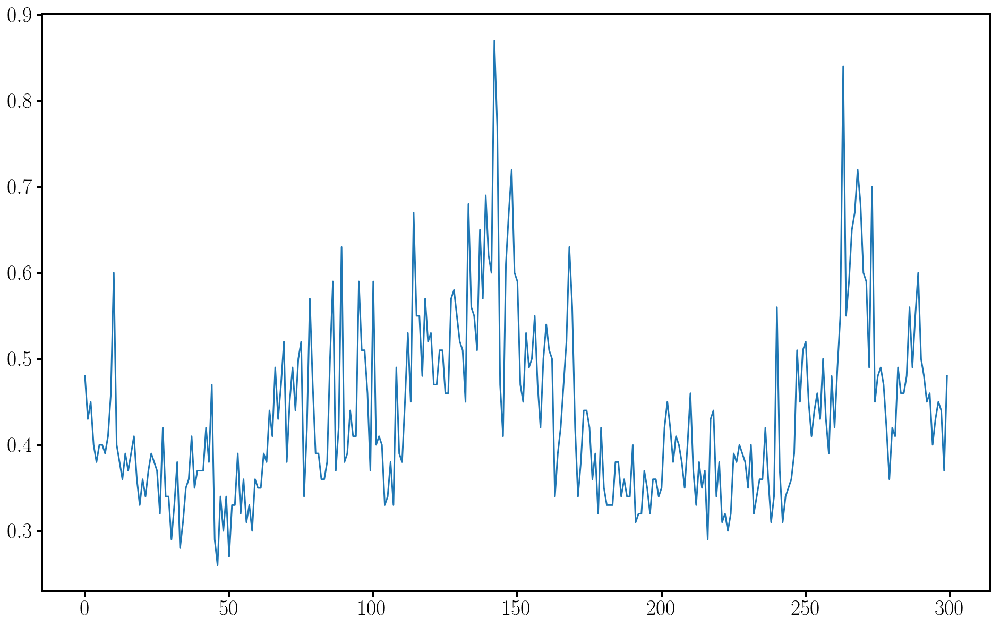

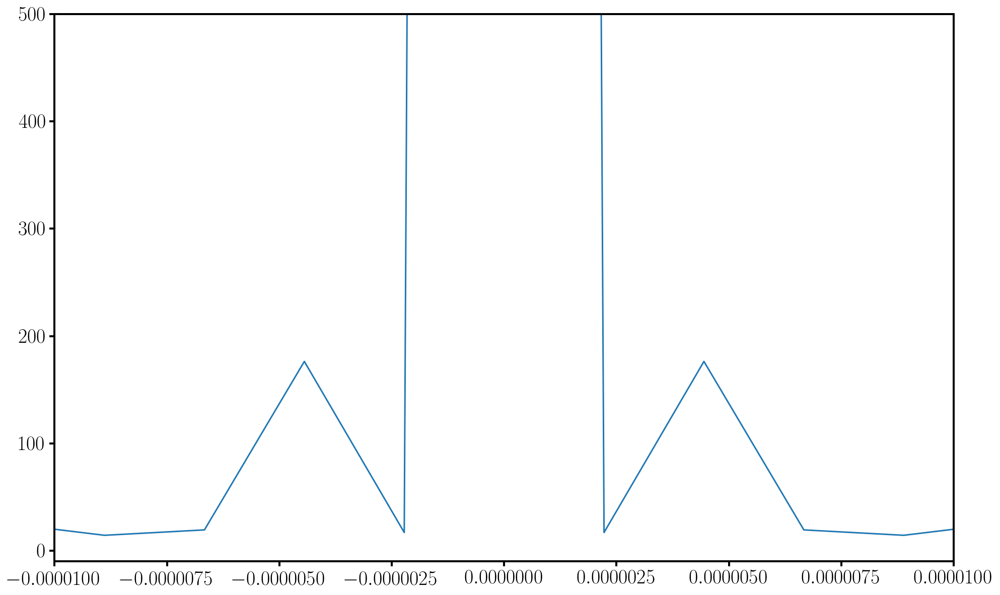

In [7]:
data = df_dimm[6]
ps = np.abs(np.fft.fft(data))**2

time_step = 25 * 60
freqs = np.fft.fftfreq(len(data), time_step)
idx = np.argsort(freqs)

plt.plot(data)
plt.show()

plt.plot(freqs[idx], ps[idx])
plt.xlim(-0.00001, 0.00001)
plt.ylim(-10,500)
# plt.yscale('log')
plt.show()

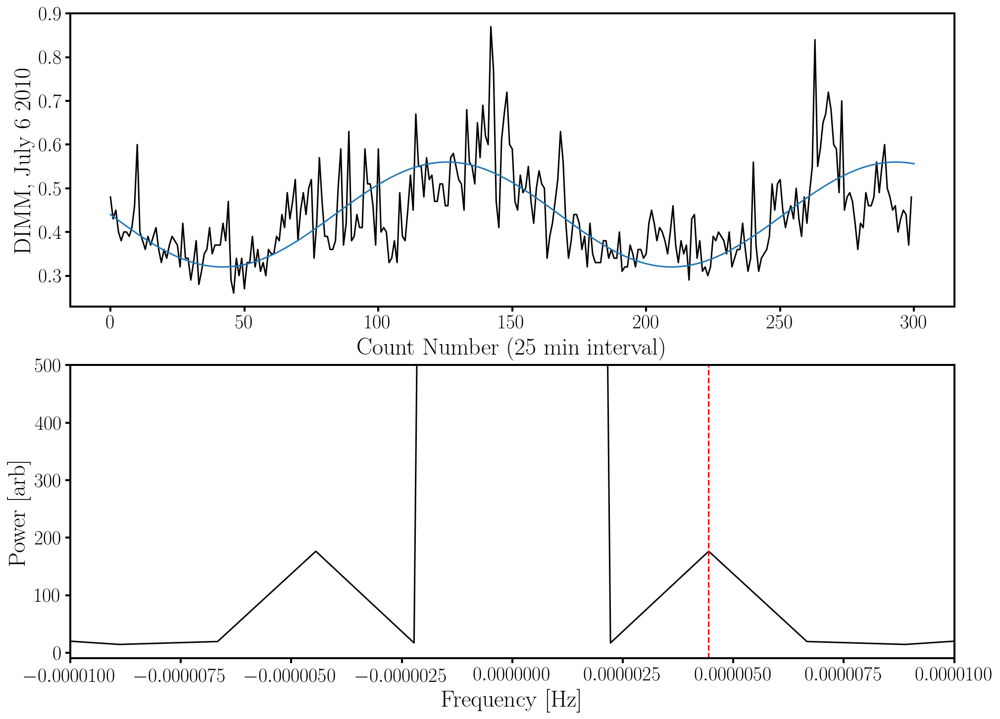

In [8]:
data = df_dimm[6]
ps = np.abs(np.fft.fft(data))**2

time_step = 25 * 60
freqs = np.fft.fftfreq(len(data), time_step)
idx = np.argsort(freqs)

fig, ax = plt.subplots(2,1, figsize = (16,12))

ax1 = ax[0]
ax2 = ax[1]
x = np.linspace(0,300,1000)
y = -0.12 * np.sin(0.000005 * 25 * 300 * x) + 0.44
ax1.plot(data, c = 'k')
ax1.plot(x,y)
ax1.set_xlabel('Count Number (25 min interval)')
ax1.set_ylabel('DIMM, July 6 2010')

ax2.plot(freqs[idx], ps[idx], c = 'k')
ax2.set_xlim(-0.00001, 0.00001)
ax2.set_ylim(-10,500)
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Power [arb]')
ax2.axvline(0.00000444, c = 'r', linestyle = '--')
# plt.yscale('log')
plt.show()

### Seeing vs. FWHM

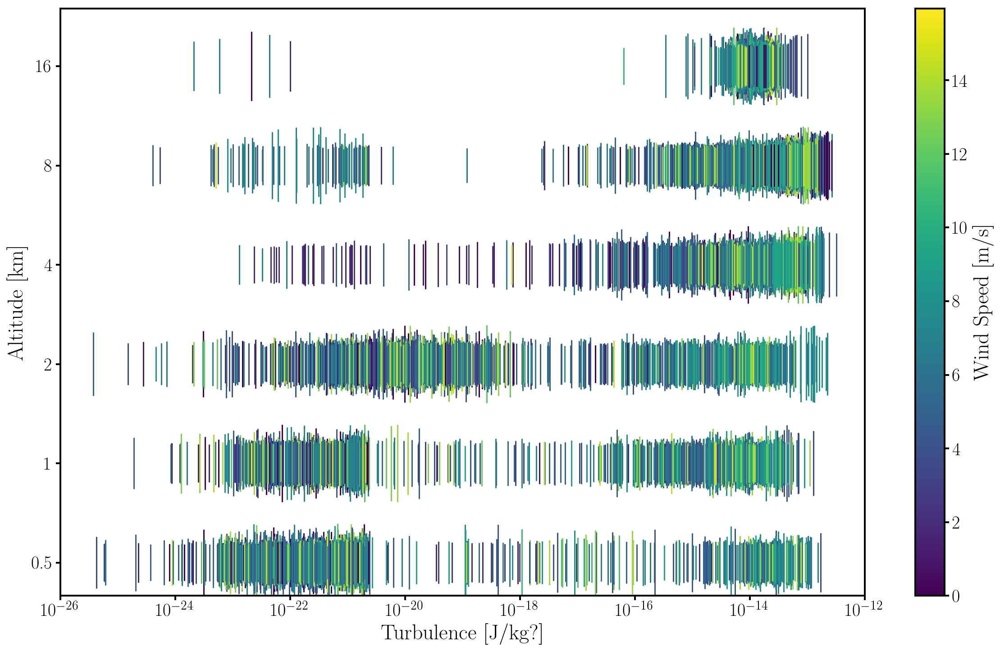

In [113]:
masspro_i = []

threshold = 180 # Time in sec before or after image was taken
lower = 50 # Lower bound on FWHM to account for extreme outliers
upper = 125 # Upper bound on FWHM to accound for extreme outliers

for i, row in df.iterrows():
    if np.abs(row['MASSPRO_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
        masspro_i.append(i)
        
half = df['MASSPRO_half'][masspro_i]
one = df['MASSPRO_1'][masspro_i]
two = df['MASSPRO_2'][masspro_i]
four = df['MASSPRO_4'][masspro_i]
eight = df['MASSPRO_8'][masspro_i]
sixteen = df['MASSPRO_16'][masspro_i]
fwhm = df['fwhm'][masspro_i]
c = df['wind_speed'][masspro_i]

alts = [half, one, two, four, eight, sixteen]

plt.figure(figsize = (20,12))
count = 1
for item in alts:
    plt.scatter(item, count*np.ones(len(item)), s = fwhm**2 / 2, c = c, marker='|')
    count +=1

plt.xlim(10**-26, 10**-12)
plt.xscale('log')
plt.yticks(np.arange(1,7),['0.5', '1', '2', '4', '8', '16'])
plt.ylabel('Altitude [km]')
plt.xlabel('Turbulence [J/kg?]')
plt.colorbar(label = 'Wind Speed [m/s]')
plt.show()

/u/steverobinson/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1320: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


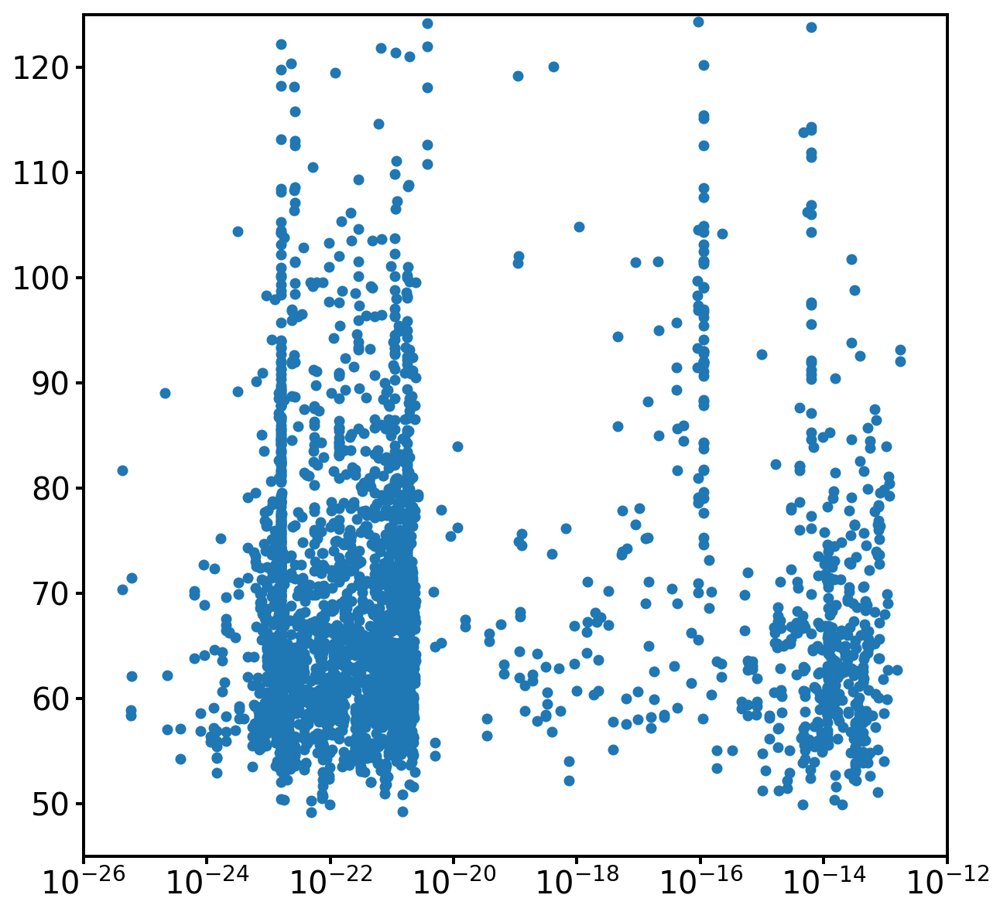

In [27]:
rcParams["text.usetex"]= False
plt.figure(figsize = (10,10))
plt.scatter(df['MASSPRO_half'], df['fwhm'])
plt.xlim(10**-26,10**-12)
plt.ylim(45,125)
plt.xscale('log')
plt.show()

/u/steverobinson/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1320: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


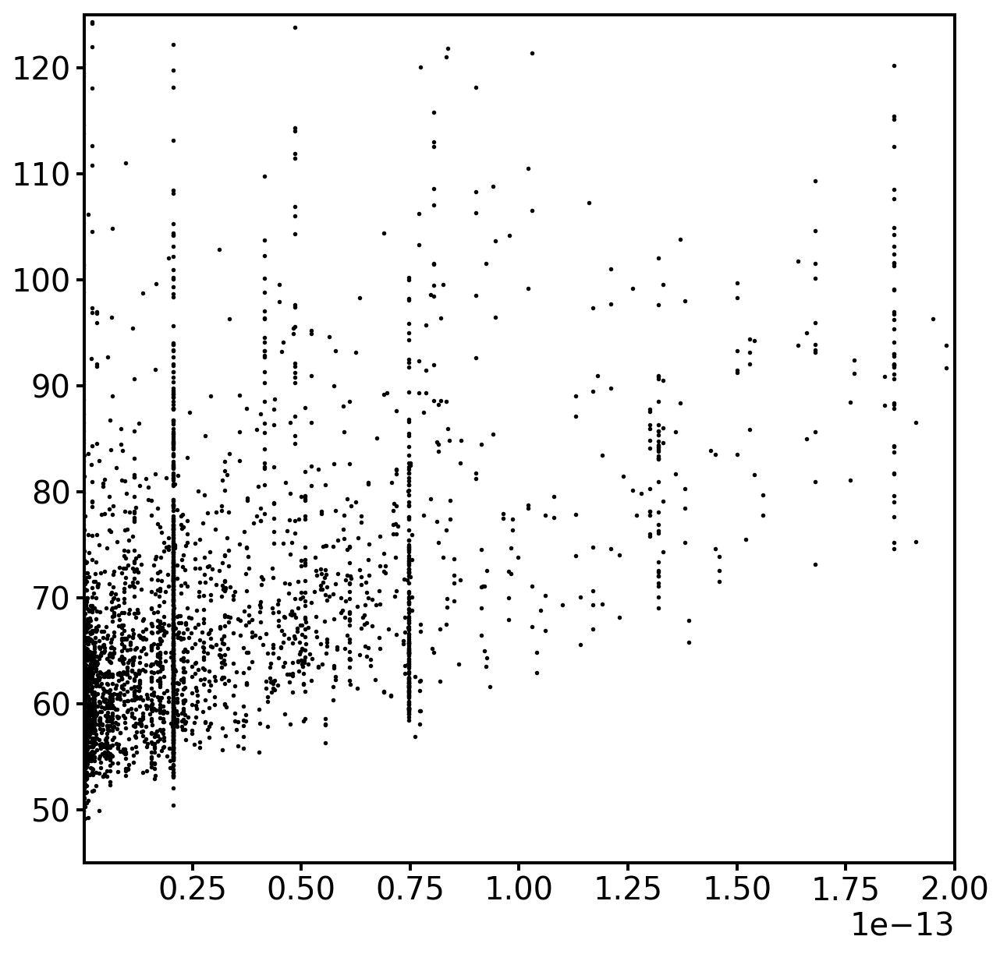

In [34]:
rcParams["text.usetex"]= False
plt.figure(figsize = (10,10))
plt.scatter(df['MASSPRO_8'], df['fwhm'], s = 3, c = 'k')
plt.xlim(10**-16,2*10**-13)
plt.ylim(45,125)
# plt.xscale('log')
plt.show()

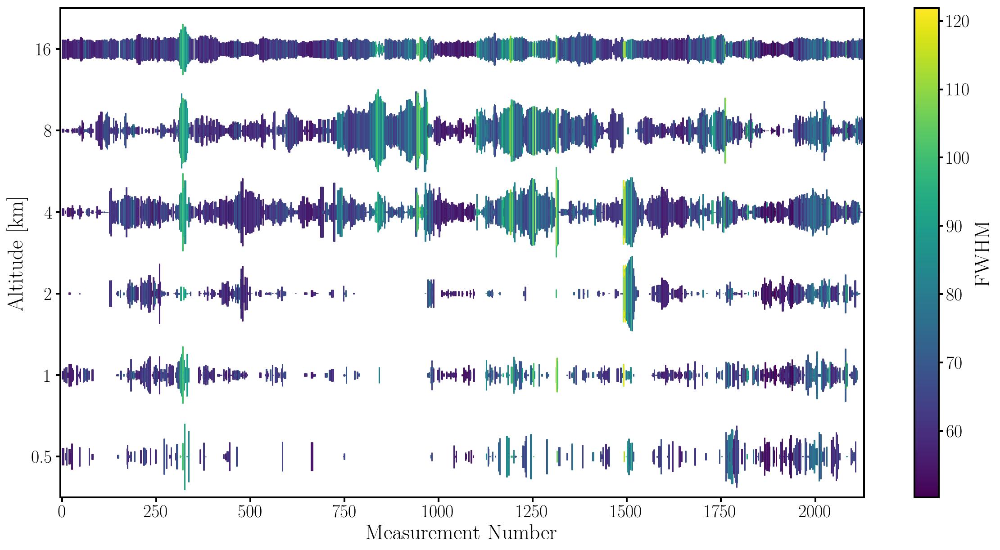

In [123]:
masspro_i = []

threshold = 180 # Time in sec before or after image was taken
lower = 50 # Lower bound on FWHM to account for extreme outliers
upper = 125 # Upper bound on FWHM to accound for extreme outliers

for i, row in df.iterrows():
    if np.abs(row['MASSPRO_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
        masspro_i.append(i)
        
half = df['MASSPRO_half'][masspro_i]
one = df['MASSPRO_1'][masspro_i]
two = df['MASSPRO_2'][masspro_i]
four = df['MASSPRO_4'][masspro_i]
eight = df['MASSPRO_8'][masspro_i]
sixteen = df['MASSPRO_16'][masspro_i]
x = range(len(masspro_i))
c = df['fwhm'][masspro_i]

alts = [half, one, two, four, eight, sixteen]

plt.figure(figsize = (20,10))
count = 1
for item in alts:
    plt.scatter(x, count*np.ones(len(item)), s = item*10**16.5, c = c, marker='|')
    count +=1

# plt.xlim(10**-26, 10**-12)
# plt.xscale('log')
plt.yticks(np.arange(1,7),['0.5', '1', '2', '4', '8', '16'])
plt.ylim(0.5,6.5)
plt.ylabel('Altitude [km]')
plt.xlabel('Measurement Number')
plt.xlim(-5, 2130)
# color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(label = 'FWHM')
plt.show()

In [16]:
print(df['MASSPRO_half'][3800])

1.8e-21


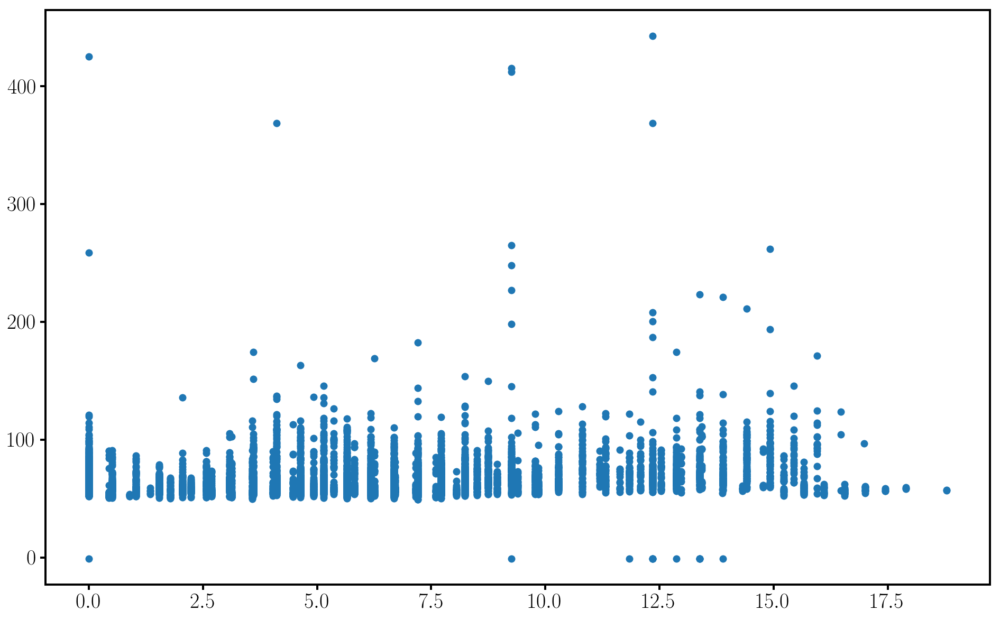

In [162]:
plt.scatter(df['wind_speed'],df['fwhm'])
plt.show()

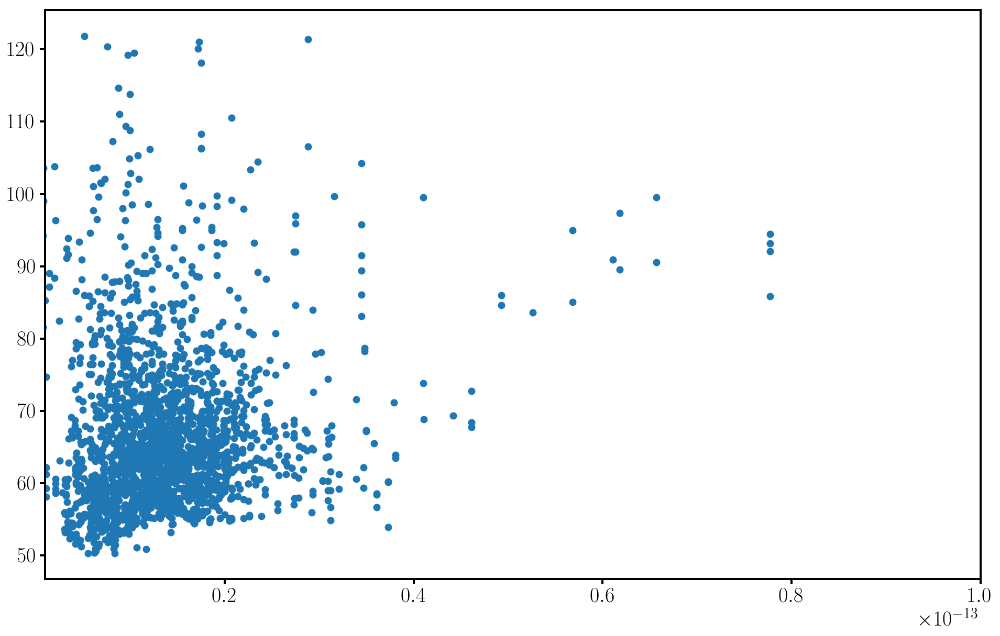

In [160]:
fwhm = df['fwhm'][masspro_i]
plt.scatter(sixteen, fwhm)
plt.xlim(10**-15, 10**-13)
# plt.xscale('log')
plt.show()

In [134]:
b = 0
d = 100
for thing in alts:
    a = thing.max()
    c = thing.min()
    if a > b:
        b = a
    if c < d:
        d = c
print(b, d)

3.17e-13 2.49e-27


In [144]:
count = 0
count2 = 0
for thing in alts:
    for item in thing:
        if item < 10**-23:
            count+=1
        if item > 10**-13:
            count2+=1
print(count, count2)

238 235


In [145]:
print(sum([len(thing) for thing in alts]))

12756


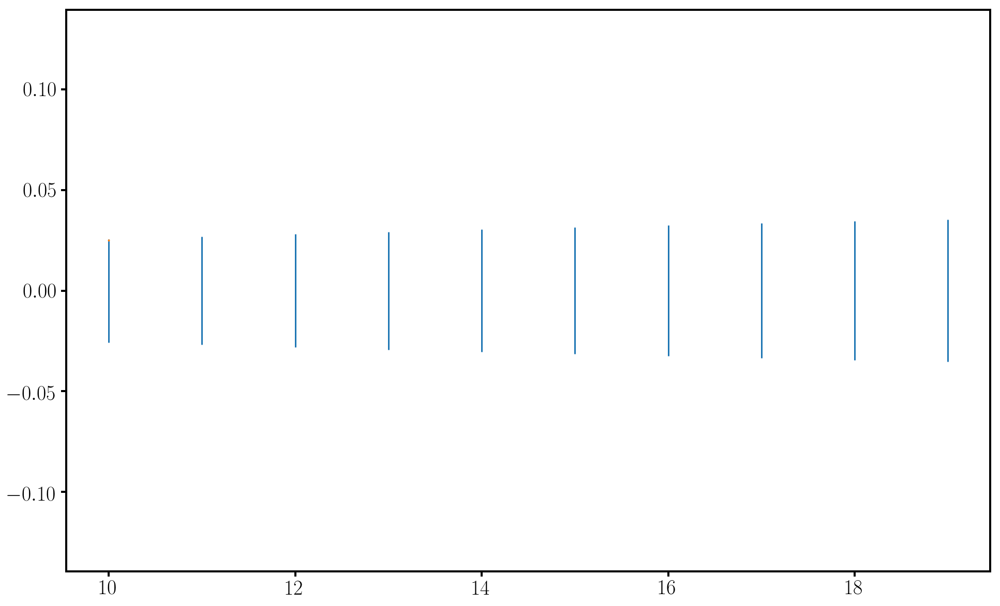

In [161]:
x = np.arange(10,20)
y = [0] * len(x)
s = x * 10**3

plt.scatter(x,y,s = s, marker = '|')
plt.scatter(x = 10, y = 0.025, s = 1)
plt.show()

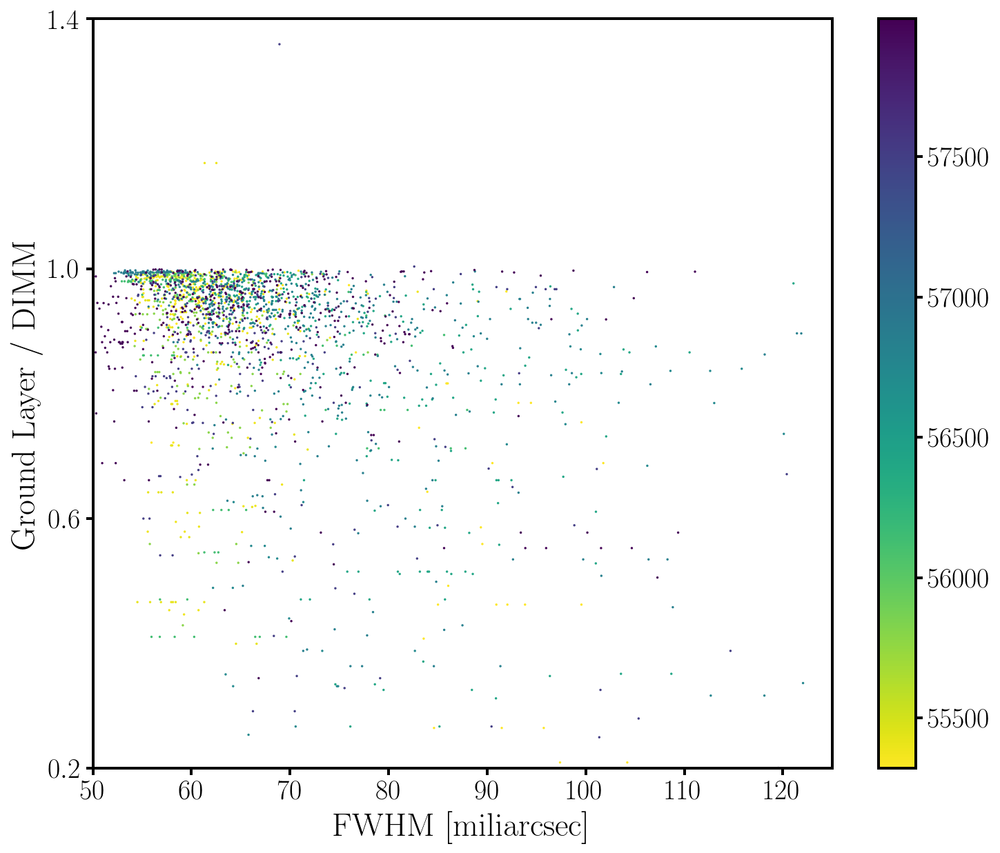

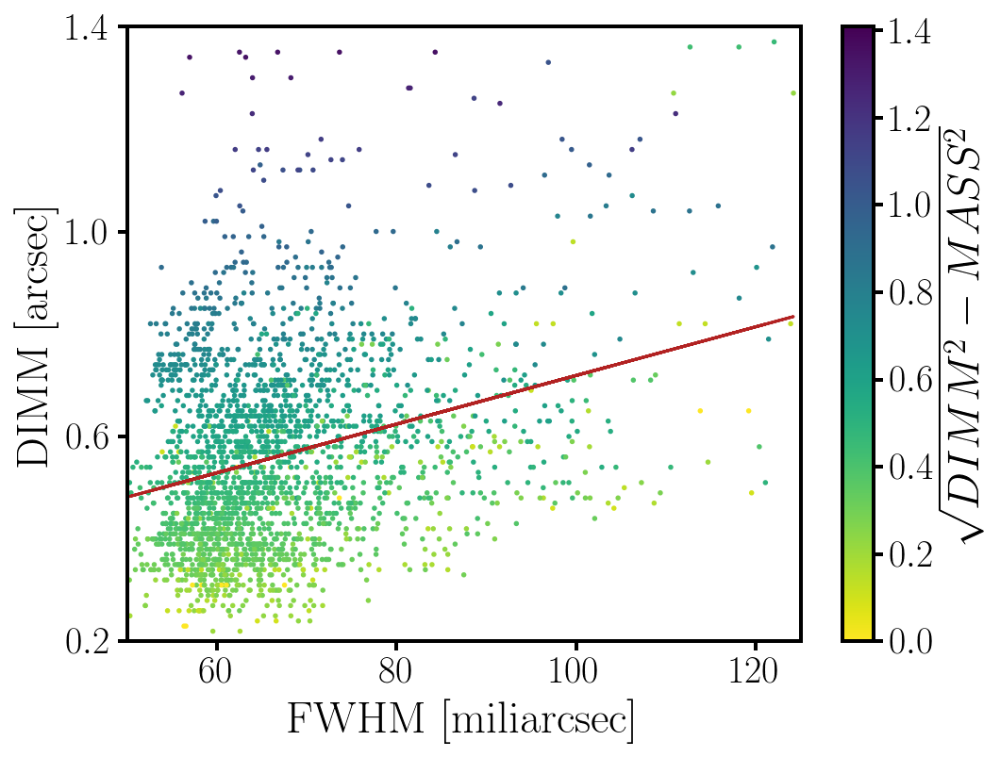

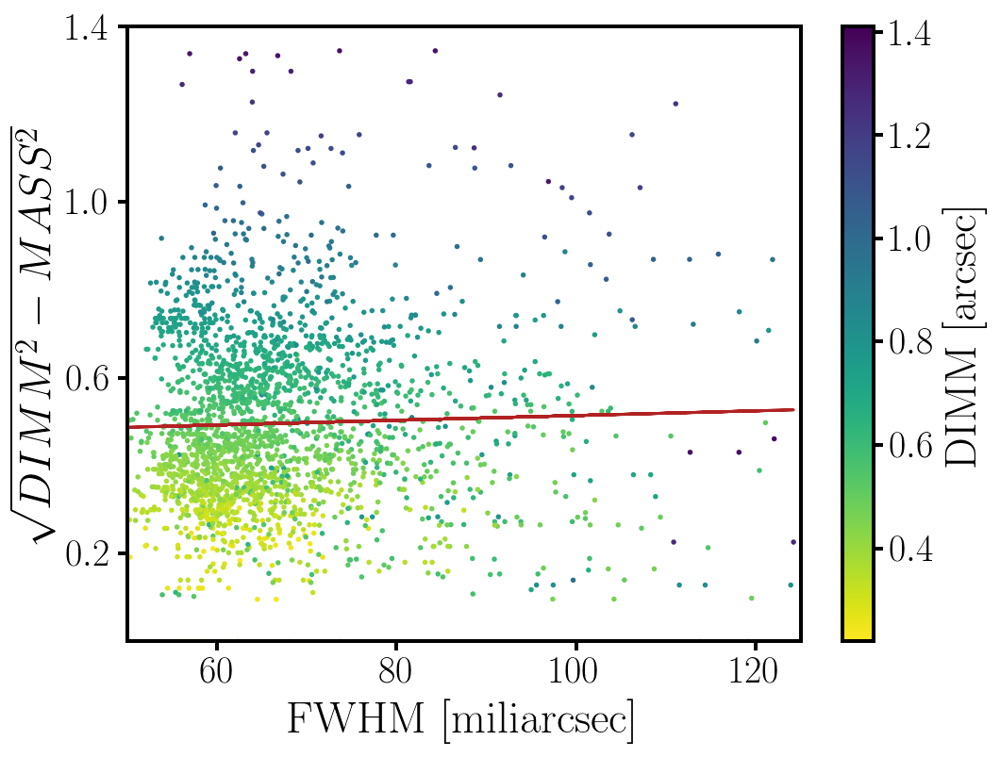

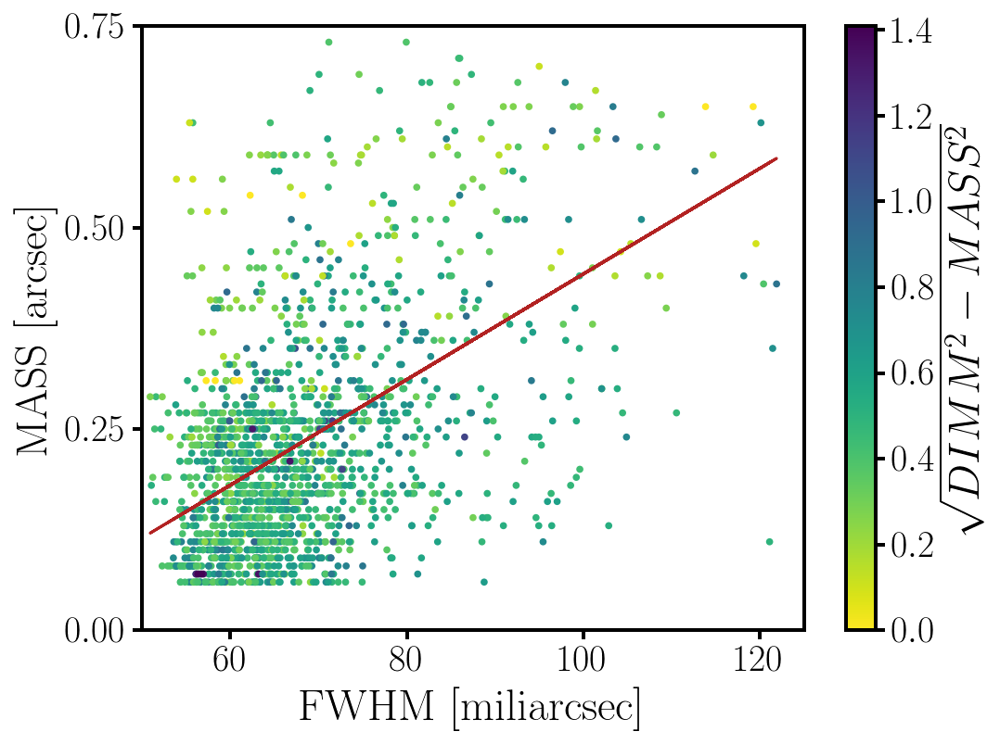

In [185]:
dimm_i = []
mass_i = []
dm_i = []

threshold = 180 # Time in sec before or after image was taken
lower = 50 # Lower bound on FWHM to account for extreme outliers
upper = 125 # Upper bound on FWHM to accound for extreme outliers

for i, row in df.iterrows():
    if np.abs(row['DIMM_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
        dimm_i.append(i)
    if np.abs(row['MASS_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
        mass_i.append(i)
    if np.abs(row['DIMM_delta_t']) < (dec_sec*threshold) and np.abs(row['MASS_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
        dm_i.append(i)

x = df['fwhm']
y1 = df['DIMM']
y2 = df['MASS']
y3 = np.sqrt(np.abs(y1**2 - y2**2))
y4 = np.abs(df['DIMM_delta_t']) / dec_sec

b1, m1 = np.polynomial.polynomial.polyfit(x[dimm_i], y1[dimm_i], deg=1, rcond=None, full=False)
fit1 = [m1 * x + b1 for x in x[dimm_i]]

b3, m3 = np.polynomial.polynomial.polyfit(x[dimm_i], y3[dimm_i], deg=1, rcond=None, full=False)
fit3 = [m3 * x + b3 for x in x[dimm_i]]

b2, m2 = np.polynomial.polynomial.polyfit(x[mass_i], y2[mass_i], deg=1, rcond=None, full=False)
fit2 = [m2 * x + b2 for x in x[mass_i]]

plt.figure(figsize = (12,10))
plt.scatter(x[dimm_i], y3[dimm_i] / y1[dimm_i], s = 0.5, c = df['mjd'][dimm_i], cmap = 'viridis_r')
# plt.plot(x[dimm_i],fit1, color = 'firebrick')
plt.ylabel('Ground Layer / DIMM')
plt.xlabel('FWHM [miliarcsec]')
plt.ylim(0.2,1.4)
plt.xlim(50,125)
plt.yticks([0.2,0.6,1,1.4])
cbar = plt.colorbar()
# cbar.set_label('\r $\Delta t $ [s]')
# plt.savefig('DIMMvsFWHM.pdf', format = 'pdf')
plt.show()

plt.figure(figsize = (8,6))
plt.scatter(x[dimm_i], y1[dimm_i], s = 3, c = y3[dimm_i], cmap = 'viridis_r')
plt.plot(x[dimm_i],fit1, color = 'firebrick')
plt.ylabel('DIMM [arcsec]')
plt.xlabel('FWHM [miliarcsec]')
plt.ylim(0.2,1.4)
plt.xlim(50,125)
plt.yticks([0.2,0.6,1,1.4])
cbar = plt.colorbar()
cbar.set_label('^\r $ \sqrt[]{DIMM^2 - MASS^2} $')
# plt.savefig('DIMMvsFWHM.pdf', format = 'pdf')
plt.show()

plt.figure(figsize = (8,6))
plt.scatter(x[dimm_i], y3[dimm_i], s = 3, c = y1[dimm_i], cmap = 'viridis_r')
plt.plot(x[dimm_i],fit3, color = 'firebrick')
plt.ylabel('^\r $ \sqrt[]{DIMM^2 - MASS^2} $')
plt.xlabel('FWHM [miliarcsec]')
plt.ylim(0,1.4)
plt.xlim(50,125)
plt.yticks([0.2,0.6,1,1.4])
cbar = plt.colorbar()
cbar.set_label('DIMM [arcsec]')
plt.show()

plt.figure(figsize = (8,6))
plt.scatter(x[mass_i], y2[mass_i], s = 8, c = y3[mass_i], cmap = 'viridis_r')
plt.plot(x[mass_i],fit2, color = 'firebrick')
plt.ylabel('MASS [arcsec]')
plt.xlabel('FWHM [miliarcsec]')
plt.xlim(50,125)
plt.ylim(0.05,0.75)
plt.yticks([0,.25,.5,.75])
cbar2 = plt.colorbar()
cbar2.set_label('^\r $ \sqrt[]{DIMM^2 - MASS^2} $')
plt.show()

### Strehl, FWHM Panels

In [86]:
df.columns

Index(['file', 'strehl', 'rms_err', 'fwhm', 'mjd', 'epoch', 'airmass', 'itime',
       'coadds', 'band', 'az', 'dmgain', 'dtgain', 'wsfrrt', 'aolbfwhm',
       'lsamppwr', 'lgrmswf', 'xref', 'yref', 'xstrehl', 'ystrehl', 'MASS',
       'MASS_mjd', 'MASS_delta_t', 'DIMM', 'DIMM_mjd', 'DIMM_delta_t',
       'MASSPRO_half', 'MASSPRO_1', 'MASSPRO_2', 'MASSPRO_4', 'MASSPRO_8',
       'MASSPRO_16', 'MASSPRO', 'MASSPRO_mjd', 'MASSPRO_delta_t',
       'wind_speed[kts]', 'wind_speed', 'wind_direction', 'temperature',
       'relative_humidity', 'pressure[mb]', 'pressure', 'cfht_mjd',
       'cfht_delta_t', 'AOAOAMED', 'TUBETEMP'],
      dtype='object')

In [36]:
fwhm = df['fwhm']
strehl = df['strehl']

In [37]:
mjd = df['mjd']

In [ ]:
i = ax.scatter(t['fit_vx'], t['fit_vy'], s = 1, alpha = 0.4, c = t['m'][:,5], cmap = 'plasma')
color_ax = fig.add_axes([.91, .123, 0.03, 0.758])
plt.colorbar(i, cax = color_ax, label = 'Magnitude')

In [214]:
z = np.arccos(1 / df['airmass'])
secz = df['airmass']

fig, ax = plt.subplots(2,1, figsize = (20,10))
plt.subplots_adjust(hspace = 0.4)
ax1 = ax[0]
ax2 = ax[1]
i = ax1.scatter(z[curious], fwhm[curious], s = 3, c = df['az'])
ax1.set_ylim(45,130)
ax1.set_xlabel('arcsec(Airmass)')
ax1.set_ylabel('FWHM [milliarcsec]')
ax1.set_xscale('log')
ax2.scatter(secz[curious], fwhm[curious], s = 3, c = df['az'])
ax2.set_xlabel('Airmass')
ax2.set_ylabel('FWHM [milliarcsec]')
ax2.set_ylim(45,130)
ax2.set_xscale('log')

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'Azimuth')
plt.show()

ValueError: Invalid RGBA argument: 188.18809999999999

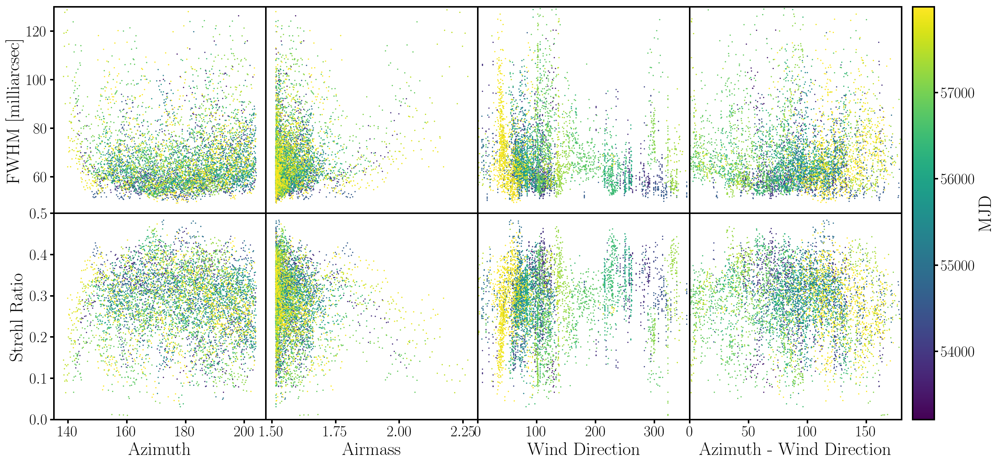

In [44]:
fig, ax = plt.subplots(2,4, figsize = (20,10))
plt.subplots_adjust(hspace = 0, wspace = 0)
        
ax1 = ax[0,0]
ax2 = ax[1,0]
ax3 = ax[0,1]
ax4 = ax[1,1]
ax5 = ax[0,2]
ax6 = ax[1,2]
ax7 = ax[0,3]
ax8 = ax[1,3]

x1 = df['az']
x2 = df['airmass']
x3 = df['wind_direction']
x4 = np.abs(x1 - x3)
y1 = df['fwhm']
y2 = df['strehl']

i = ax1.scatter(x1, y1, s = 0.5, c = mjd)
# ax1.set_xlim(50,650)
ax1.set_xticks([])
ax1.set_ylim(45,130)
ax1.set_ylabel('FWHM [milliarcsec]')

ax2.scatter(x1, y2, s = 0.5, c = mjd)
ax2.set_ylim(0,0.5)
# ax2.set_xlim(50,650)
# ax2.set_xticks([0,300,600])
ax2.set_ylabel('Strehl Ratio')
ax2.set_xlabel('Azimuth')

ax3.scatter(x2, y1, s = 0.5, c = mjd)
# ax3.set_xlim(0.7,1.5)
ax3.set_ylim(45,130)
ax3.set_xticks([])
ax3.set_yticks([])

ax4.scatter(x2, y2, s = 0.5, c = mjd)
ax4.set_ylim(0,0.5)
# ax4.set_xlim(0.7,1.5)
ax4.set_yticks([])
ax4.set_xlabel('Airmass')

ax5.scatter(x3, y1, s = 0.5, c = mjd)
ax5.set_ylim(45,125)
ax5.set_xlim(0,360)
ax5.set_xticks([])
ax5.set_yticks([])

ax6.scatter(x3, y2, s = 0.5, c = mjd)
ax6.set_ylim(0,0.5)
ax6.set_xlim(0,360)
ax6.set_yticks([])
ax6.set_xlabel('Wind Direction')

ax7.scatter(x4, y1, s = 0.5, c = mjd)
ax7.set_ylim(45,125)
ax7.set_xlim(0,180)
ax7.set_xticks([])
ax7.set_yticks([])

ax8.scatter(x4, y2, s = 0.5, c = mjd)
ax8.set_ylim(0,0.5)
ax8.set_xlim(0,180)
ax8.set_yticks([])
ax8.set_xlabel('Azimuth - Wind Direction')

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'MJD')
plt.savefig('az_panel.pdf', format = 'pdf', transparent = True)

plt.show()

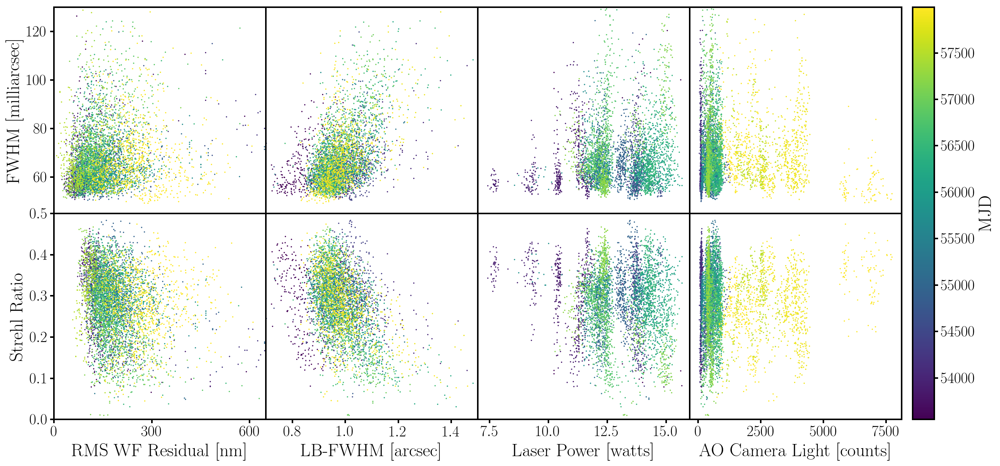

In [43]:
# AO system: lgrmswf, aolbfwhm, AOAOAMED, lsamppwr, dmgain, dtgain, wsfrrt, tubetemp

ii = []
jj = []

for i, row in df.iterrows():
    if row['fwhm'] > 50 and row['fwhm'] < 125 and row['lgrmswf'] > 40 and row['lgrmswf'] < 650:
        ii.append(i)
    if row['fwhm'] > 50 and row['fwhm'] < 125 and row['aolbfwhm'] > 0.7 and row['aolbfwhm'] < 1.4:
        jj.append(i)

fig, ax = plt.subplots(2,4, figsize = (20,10))
plt.subplots_adjust(hspace = 0, wspace = 0)
        
ax1 = ax[0,0]
ax2 = ax[1,0]
ax3 = ax[0,1]
ax4 = ax[1,1]
ax5 = ax[0,2]
ax6 = ax[1,2]
ax7 = ax[0,3]
ax8 = ax[1,3]

x1 = df['lgrmswf']
x2 = df['aolbfwhm']
x3 = df['lsamppwr']
x4 = df['AOAOAMED']
fwhm = df['fwhm']
strehl = df['strehl']

i = ax1.scatter(x1,fwhm, s = 0.5, c = mjd)
ax1.set_xlim(50,650)
ax1.set_xticks([])
ax1.set_ylim(45,130)
ax1.set_ylabel('FWHM [milliarcsec]')

ax2.scatter(x1,strehl, s = 0.5, c = mjd)
ax2.set_ylim(0,0.5)
ax2.set_xlim(50,650)
ax2.set_xticks([0,300,600])
ax2.set_ylabel('Strehl Ratio')
ax2.set_xlabel('RMS WF Residual [nm]')

ax3.scatter(x2,fwhm, s = 0.5, c = mjd)
ax3.set_xlim(0.7,1.5)
ax3.set_ylim(45,130)
ax3.set_xticks([])
ax3.set_yticks([])

ax4.scatter(x2,strehl, s = 0.5, c = mjd)
ax4.set_ylim(0,0.5)
ax4.set_xlim(0.7,1.5)
ax4.set_yticks([])
ax4.set_xlabel('LB-FWHM [arcsec]')

ax5.scatter(x3,fwhm, s = 0.5, c = mjd)
ax5.set_ylim(45,125)
ax5.set_xlim(7,16)
ax5.set_xticks([])
ax5.set_yticks([])

ax6.scatter(x3,strehl, s = 0.5, c = mjd)
ax6.set_ylim(0,0.5)
ax6.set_xlim(7,16)
ax6.set_yticks([])
ax6.set_xlabel('Laser Power [watts]')

ax7.scatter(x4,fwhm, s = 0.5, c = mjd)
ax7.set_ylim(45,125)
ax7.set_xticks([])
ax7.set_yticks([])

ax8.scatter(x4,strehl, s = 0.5, c = mjd)
ax8.set_ylim(0,0.5)
ax8.set_yticks([])
ax8.set_xlabel('AO Camera Light [counts]')

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'MJD')
plt.savefig('AO_panel.pdf', format = 'pdf', transparent = True)
plt.show()

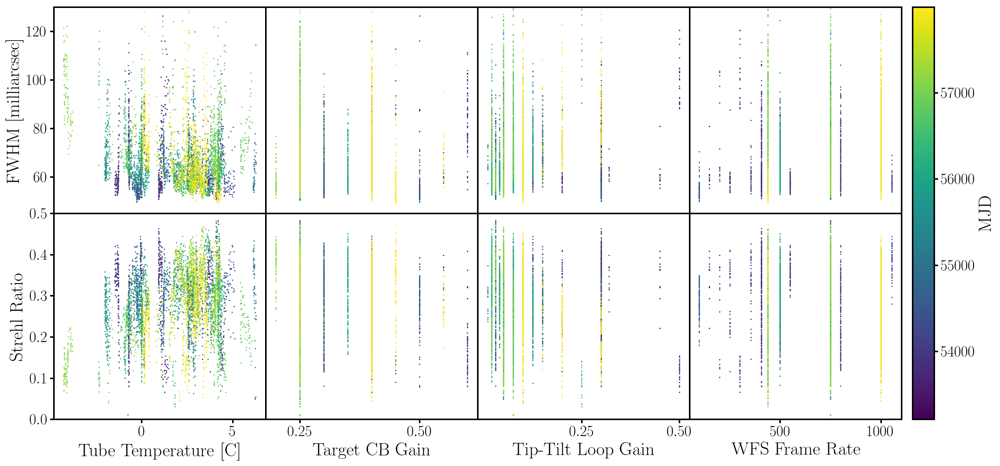

In [44]:
fig, ax = plt.subplots(2,4, figsize = (20,10))
plt.subplots_adjust(hspace = 0, wspace = 0)
        
ax1 = ax[0,0]
ax2 = ax[1,0]
ax3 = ax[0,1]
ax4 = ax[1,1]
ax5 = ax[0,2]
ax6 = ax[1,2]
ax7 = ax[0,3]
ax8 = ax[1,3]

x1 = df['TUBETEMP']
x2 = df['dmgain']
x3 = df['dtgain']
x4 = df['wsfrrt']
y1 = df['fwhm']
y2 = df['strehl']

i = ax1.scatter(x1, y1, s = 0.5, c = mjd)
# ax1.set_xlim(50,650)
ax1.set_xticks([])
ax1.set_ylim(45,130)
ax1.set_ylabel('FWHM [milliarcsec]')

ax2.scatter(x1, y2, s = 0.5, c = mjd)
ax2.set_ylim(0,0.5)
# ax2.set_xlim(50,650)
# ax2.set_xticks([0,300,600])
ax2.set_ylabel('Strehl Ratio')
ax2.set_xlabel('Tube Temperature [C]')

ax3.scatter(x2, y1, s = 0.5, c = mjd)
# ax3.set_xlim(0.7,1.5)
ax3.set_ylim(45,130)
ax3.set_xticks([])
ax3.set_yticks([])

ax4.scatter(x2, y2, s = 0.5, c = mjd)
ax4.set_ylim(0,0.5)
# ax4.set_xlim(0.7,1.5)
ax4.set_yticks([])
ax4.set_xticks([0.25, 0.5])
ax4.set_xlabel('Target CB Gain')

ax5.scatter(x3, y1, s = 0.5, c = mjd)
ax5.set_ylim(45,125)
# ax5.set_xlim(7,16)
ax5.set_xticks([])
ax5.set_yticks([])

ax6.scatter(x3, y2, s = 0.5, c = mjd)
ax6.set_ylim(0,0.5)
# ax6.set_xlim(7,16)
ax6.set_yticks([])
ax6.set_xticks([0.25, 0.5])
ax6.set_xlabel('Tip-Tilt Loop Gain')

ax7.scatter(x4, y1, s = 0.5, c = mjd)
ax7.set_ylim(45,125)
ax7.set_xticks([])
ax7.set_yticks([])

ax8.scatter(x4, y2, s = 0.5, c = mjd)
ax8.set_ylim(0,0.5)
ax8.set_yticks([])
ax8.set_xlabel('WFS Frame Rate')

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'MJD')
plt.savefig('instrument_panel.pdf', format = 'pdf', transparent = True)
plt.show()

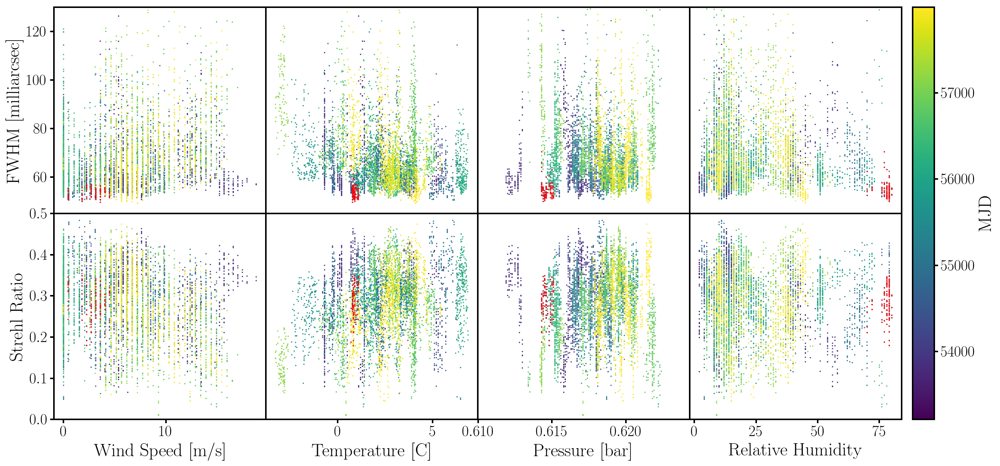

In [213]:
fig, ax = plt.subplots(2,4, figsize = (20,10))
plt.subplots_adjust(hspace = 0, wspace = 0)
        
ax1 = ax[0,0]
ax2 = ax[1,0]
ax3 = ax[0,1]
ax4 = ax[1,1]
ax5 = ax[0,2]
ax6 = ax[1,2]
ax7 = ax[0,3]
ax8 = ax[1,3]

x1 = df['wind_speed']
x2 = df['temperature']
x3 = df['pressure']
x4 = df['relative_humidity']
y1 = df['fwhm']
y2 = df['strehl']

i = ax1.scatter(x1, y1, s = 0.5, c = mjd)
ax1.scatter(x1[curious], y1[curious], s = 0.5, c = 'r')
# ax1.set_xlim(50,650)
ax1.set_xticks([])
ax1.set_ylim(45,130)
ax1.set_ylabel('FWHM [milliarcsec]')

ax2.scatter(x1, y2, s = 0.5, c = mjd)
ax2.scatter(x1[curious], y2[curious], s = 0.5, c = 'r')
ax2.set_ylim(0,0.5)
# ax2.set_xlim(50,650)
# ax2.set_xticks([0,300,600])
ax2.set_ylabel('Strehl Ratio')
ax2.set_xlabel('Wind Speed [m/s]')

ax3.scatter(x2, y1, s = 0.5, c = mjd)
ax3.scatter(x2[curious], y1[curious], s = 0.5, c = 'r')
# ax3.set_xlim(0.7,1.5)
ax3.set_ylim(45,130)
ax3.set_xticks([])
ax3.set_yticks([])

ax4.scatter(x2, y2, s = 0.5, c = mjd)
ax4.scatter(x2[curious], y2[curious], s = 0.5, c = 'r')
ax4.set_ylim(0,0.5)
# ax4.set_xlim(0.7,1.5)
ax4.set_yticks([])
ax4.set_xlabel('Temperature [C]')

ax5.scatter(x3, y1, s = 0.5, c = mjd)
ax5.scatter(x3[curious], y1[curious], s = 0.5, c = 'r')
ax5.set_ylim(45,125)
# ax5.set_xlim(7,16)
ax5.set_xticks([])
ax5.set_yticks([])

ax6.scatter(x3, y2, s = 0.5, c = mjd)
ax6.scatter(x3[curious], y2[curious], s = 0.5, c = 'r')
ax6.set_ylim(0,0.5)
# ax6.set_xlim(7,16)
ax6.set_yticks([])
ax6.set_xlabel('Pressure [bar]')

ax7.scatter(x4, y1, s = 0.5, c = mjd)
ax7.scatter(x4[curious], y1[curious], s = 0.5, c = 'r')
ax7.set_ylim(45,125)
ax7.set_xticks([])
ax7.set_yticks([])

ax8.scatter(x4, y2, s = 0.5, c = mjd)
ax8.scatter(x4[curious], y2[curious], s = 0.5, c = 'r')
ax8.set_ylim(0,0.5)
ax8.set_yticks([])
ax8.set_xlabel('Relative Humidity')



color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'MJD')
plt.savefig('CFHT_panel.pdf', format = 'pdf', transparent = True)
plt.show()

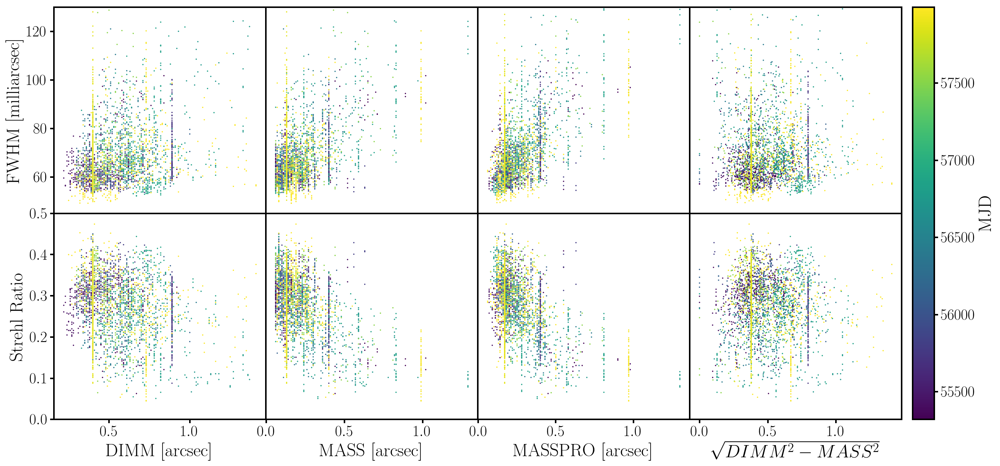

In [46]:
fig, ax = plt.subplots(2,4, figsize = (20,10))
plt.subplots_adjust(hspace = 0, wspace = 0)
        
ax1 = ax[0,0]
ax2 = ax[1,0]
ax3 = ax[0,1]
ax4 = ax[1,1]
ax5 = ax[0,2]
ax6 = ax[1,2]
ax7 = ax[0,3]
ax8 = ax[1,3]

x1 = df['DIMM']
x2 = df['MASS']
x3 = df['MASSPRO']
x4 = np.sqrt(np.abs(x1**2 - x2**2))
y1 = df['fwhm']
y2 = df['strehl']

i = ax1.scatter(x1, y1, s = 0.5, c = mjd)
# ax1.set_xlim(50,650)
ax1.set_xticks([])
ax1.set_ylim(45,130)
ax1.set_ylabel('FWHM [milliarcsec]')

ax2.scatter(x1, y2, s = 0.5, c = mjd)
ax2.set_ylim(0,0.5)
# ax2.set_xlim(50,650)
# ax2.set_xticks([0,300,600])
ax2.set_ylabel('Strehl Ratio')
ax2.set_xlabel('DIMM [arcsec]')

ax3.scatter(x2, y1, s = 0.5, c = mjd)
# ax3.set_xlim(0.7,1.5)
ax3.set_ylim(45,130)
ax3.set_xticks([])
ax3.set_yticks([])

ax4.scatter(x2, y2, s = 0.5, c = mjd)
ax4.set_ylim(0,0.5)
# ax4.set_xlim(0.7,1.5)
ax4.set_yticks([])
ax4.set_xlabel('MASS [arcsec]')

ax5.scatter(x3, y1, s = 0.5, c = mjd)
ax5.set_ylim(45,125)
# ax5.set_xlim(7,16)
ax5.set_xticks([])
ax5.set_yticks([])

ax6.scatter(x3, y2, s = 0.5, c = mjd)
ax6.set_ylim(0,0.5)
# ax6.set_xlim(7,16)
ax6.set_yticks([])
ax6.set_xlabel('MASSPRO [arcsec]')

ax7.scatter(x4, y1, s = 0.5, c = mjd)
ax7.set_ylim(45,125)
ax7.set_xticks([])
ax7.set_yticks([])

ax8.scatter(x4, y2, s = 0.5, c = mjd)
ax8.set_ylim(0,0.5)
ax8.set_yticks([])
ax8.set_xlabel('^\r $ \sqrt[]{DIMM^2 - MASS^2} $')

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'MJD')
plt.savefig('seeing_panel.pdf', format = 'pdf', transparent = True)
plt.show()

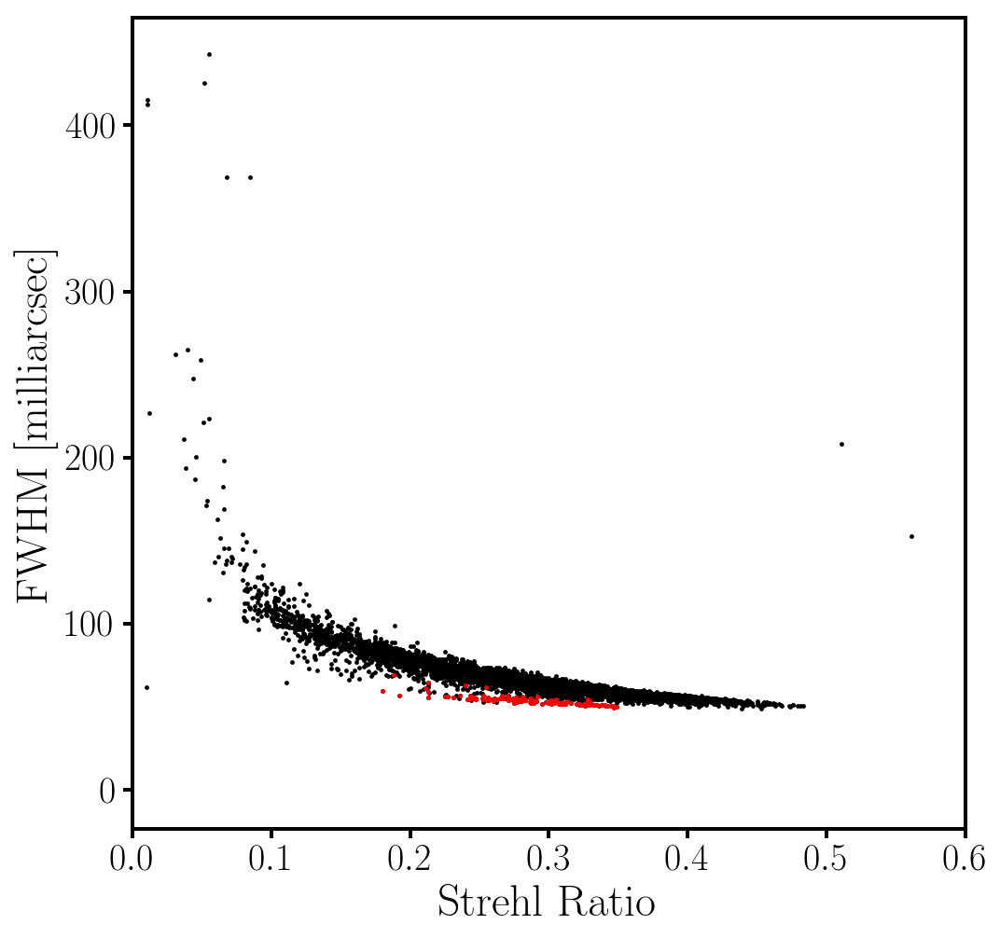

In [216]:
plt.figure(figsize = (8,8))
plt.scatter(df['strehl'], df['fwhm'], c = 'k', s = 2)
plt.scatter(df['strehl'][curious], df['fwhm'][curious], c = 'r', s = 2)
plt.xlim(0,0.6)
plt.xlabel('Strehl Ratio')
plt.ylabel('FWHM [milliarcsec]')
plt.savefig('strehl_fwhm.pdf', format = 'pdf')
plt.show()

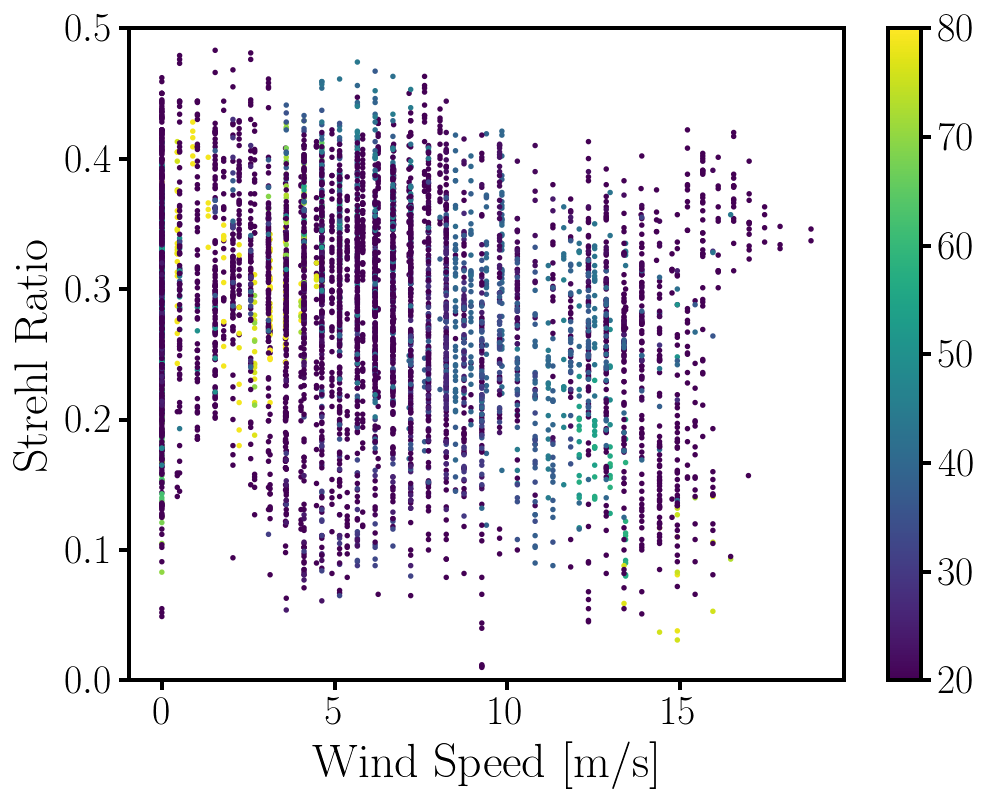

In [26]:
plt.figure(figsize = (8,6))
plt.scatter(df['wind_speed'], df['strehl'], s = 3, c = df['relative_humidity'], vmin = 20)
plt.ylim(0,0.5)
# plt.xlim(50,650)
# plt.xticks([0,300,600])
plt.ylabel('Strehl Ratio')
plt.xlabel('Wind Speed [m/s]')
plt.colorbar()
plt.show()

### Longterm Performance

In [186]:
days = sorted(list(set([int(mjd) for mjd in df.mjd])))
print(days)

[53212, 53551, 53581, 53582, 53858, 53876, 53906, 53907, 53933, 54237, 54322, 54324, 54601, 54671, 54952, 54953, 54955, 55036, 55083, 55320, 55321, 55383, 55423, 55708, 55796, 55797, 56062, 56065, 56132, 56408, 56409, 56493, 56504, 56735, 56736, 56765, 56766, 56788, 56796, 56841, 56842, 56873, 56875, 57112, 57113, 57114, 57156, 57243, 57244, 57245, 57511, 57525, 57877, 57878, 57952, 57961, 57973, 57974, 57975, 57976, 57988, 57989, 57991]


In [187]:
print(df.columns)

Index(['file', 'strehl', 'rms_err', 'fwhm', 'mjd', 'epoch', 'airmass', 'itime',
       'coadds', 'band', 'az', 'dmgain', 'dtgain', 'wsfrrt', 'aolbfwhm',
       'lsamppwr', 'lgrmswf', 'xref', 'yref', 'xstrehl', 'ystrehl', 'MASS',
       'MASS_mjd', 'MASS_delta_t', 'DIMM', 'DIMM_mjd', 'DIMM_delta_t',
       'MASSPRO_half', 'MASSPRO_1', 'MASSPRO_2', 'MASSPRO_4', 'MASSPRO_8',
       'MASSPRO_16', 'MASSPRO', 'MASSPRO_mjd', 'MASSPRO_delta_t',
       'wind_speed[kts]', 'wind_speed', 'wind_direction', 'temperature',
       'relative_humidity', 'pressure[mb]', 'pressure', 'cfht_mjd',
       'cfht_delta_t', 'AOAOAMED', 'TUBETEMP'],
      dtype='object')


In [164]:
days = [(day - 53212 + 251) / 30.67 for day in days]
print(days)

[8.183893055102706, 19.237039452233454, 20.2151940006521, 20.247799152266058, 29.246820997717638, 29.833713726768828, 30.81186827518748, 30.844473426801432, 31.69220736876426, 41.60417345940658, 44.37561134659276, 44.44082164982067, 53.47244864688621, 55.75480925986305, 64.91685686338441, 64.94946201499836, 65.01467231822627, 67.65568959895663, 69.18813172481252, 76.91555265731985, 76.94815780893381, 78.96967720899902, 80.27388327355722, 89.56635148353439, 92.43560482556244, 92.46820997717639, 101.10857515487446, 101.20639060971632, 103.39093576785132, 112.3899576133029, 112.42256276491685, 115.16139550048906, 115.52005216824257, 123.05184219106619, 123.08444734268014, 124.02999673948483, 124.0626018910988, 124.7799152266058, 125.04075643951744, 126.50798826214542, 126.54059341375937, 127.55135311379198, 127.61656341701988, 135.3439843495272, 135.37658950114118, 135.40919465275513, 136.77861102054123, 139.61525921095532, 139.64786436256927, 139.68046951418324, 148.35343984349527, 148.8

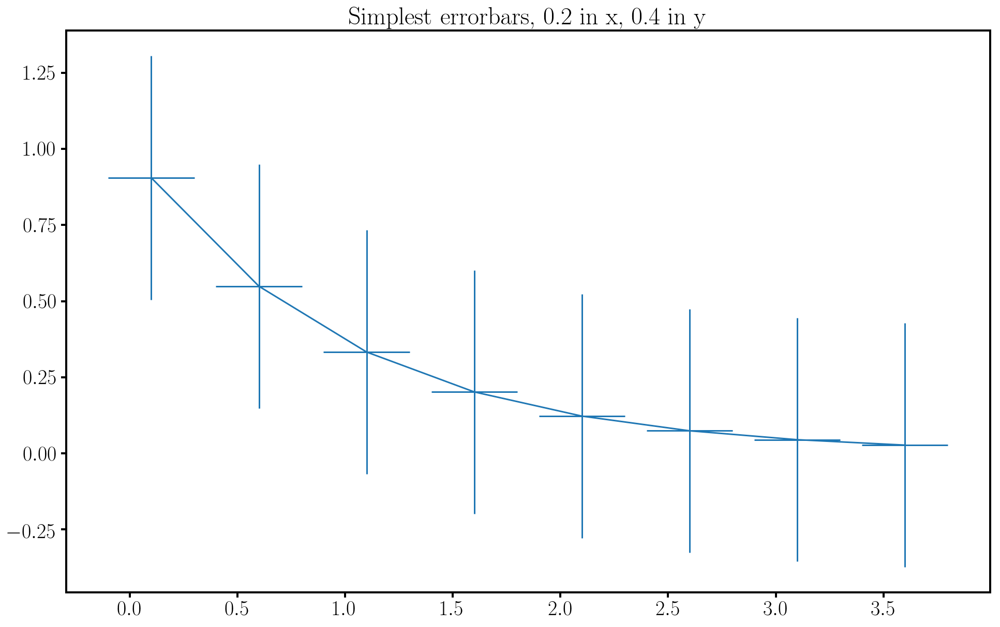

In [135]:
# example data
x = np.arange(0.1, 4, 0.5)
y = np.exp(-x)

# example variable error bar values
yerr = 0.1 + 0.2*np.sqrt(x)
xerr = 0.1 + yerr

# First illustrate basic pyplot interface, using defaults where possible.
plt.figure()
plt.errorbar(x, y, xerr=0.2, yerr=0.4)
plt.title("Simplest errorbars, 0.2 in x, 0.4 in y")
plt.show()

In [197]:
print(df['aolbfwhm'][10])

nan


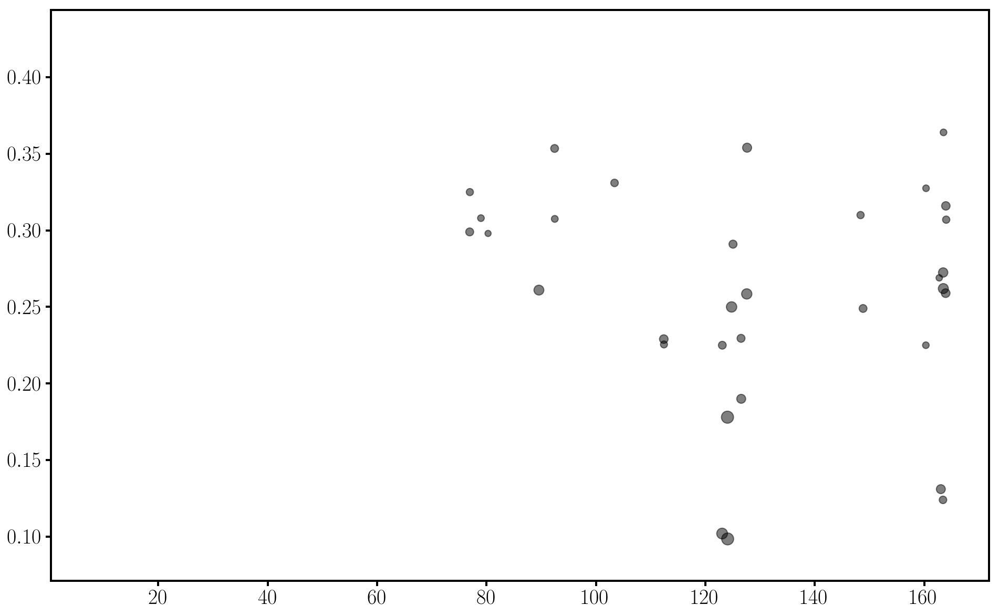

In [181]:
plt.scatter(days, strehl_medians, s = np.array(dimm_mean) * 100, c = 'k', alpha = 0.5)
# plt.colorbar()
plt.show()

In [10]:
days = sorted(list(set([int(mjd) for mjd in df.mjd])))

pro_half = []
pro_1 = []
pro_2 = []
pro_4 = []
pro_8 = []
pro_16 = []
errhalf = []
err1 = []
err2 = []
err4 = []
err8 = []
err16 = []

for day in days:
    half = []
    one = []
    two = []
    four = []
    eight = []
    sixteen = []
    for i, row in df_good.iterrows():
        if int(row['mjd']) == day:
            half.append(row['MASSPRO_half'])
            one.append(row['MASSPRO_1'])
            two.append(row['MASSPRO_2'])
            four.append(row['MASSPRO_4'])
            eight.append(row['MASSPRO_8'])
            sixteen.append(row['MASSPRO_16'])
    
    pro_half.append(np.median(half))
    pro_1.append(np.median(one))
    pro_2.append(np.median(two))
    pro_4.append(np.median(four))
    pro_8.append(np.median(eight))
    pro_16.append(np.median(sixteen))
    
    errhalf.append(np.std(pro_half) / np.sqrt(len(pro_half)))
    err1.append(np.std(pro_1) / np.sqrt(len(pro_1)))
    err2.append(np.std(pro_2) / np.sqrt(len(pro_2)))
    err4.append(np.std(pro_4) / np.sqrt(len(pro_4)))
    err8.append(np.std(pro_8) / np.sqrt(len(pro_8)))
    err16.append(np.std(pro_16) / np.sqrt(len(pro_16)))
    
days = [(day - 53212 + 251) / 30.67 for day in days]

/anaconda/lib/python3.6/site-packages/numpy/lib/function_base.py:3858: RuntimeWarning: Invalid value encountered in median
  r = func(a, **kwargs)


In [27]:
print(len(days), len(pro_1))

63 63


In [40]:
725/25.4

28.543307086614174

In [21]:
print(df['MASSPRO_8'].median())

2.06e-14


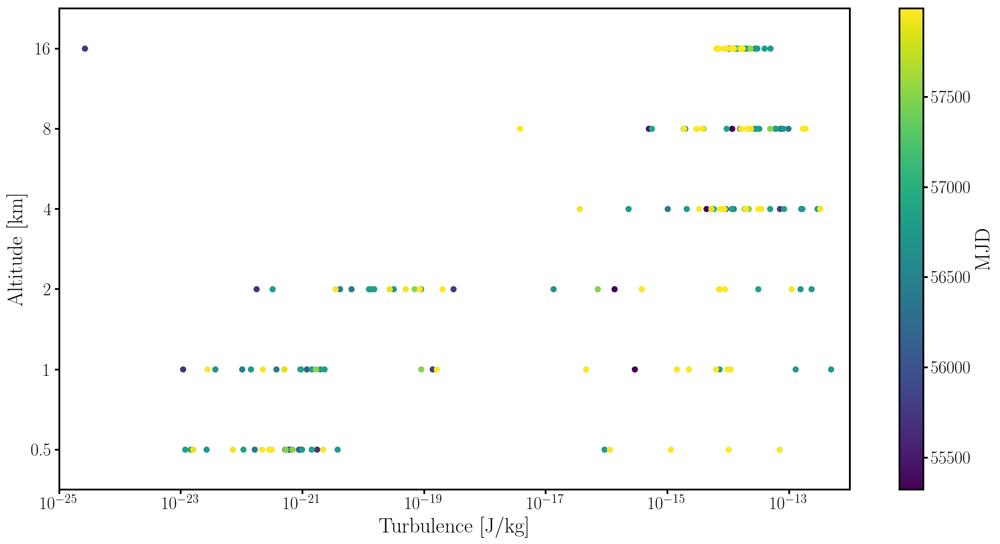

In [39]:
# masspro_i = []

# threshold = 180 # Time in sec before or after image was taken
# lower = 50 # Lower bound on FWHM to account for extreme outliers
# upper = 125 # Upper bound on FWHM to accound for extreme outliers

# for i, row in df.iterrows():
#     if np.abs(row['MASSPRO_delta_t']) < (dec_sec*threshold) and row['fwhm'] > lower and row['fwhm'] < upper:
#         masspro_i.append(i)
        
half = pro_half
one = pro_1
two = pro_2
four = pro_4
eight = pro_8
sixteen = pro_16
# x = range(len(masspro_i))
# c = df['fwhm'][masspro_i]

alts = [pro_half, pro_1, pro_2, pro_4, pro_8, pro_16]
errs = [errhalf, err1, err2, err4, err8, err16]

days = sorted(list(set([int(mjd) for mjd in df.mjd])))


plt.figure(figsize = (20,10))
count = 1
for item in alts:
    plt.scatter(item, count*np.ones(len(item)), c = days) #, s = item*10**16.5, c = c, marker='|')
    count +=1

# plt.xlim(10**-26, 10**-12)
# plt.xscale('log')
plt.yticks(np.arange(1,7),['0.5', '1', '2', '4', '8', '16'])
plt.ylim(0.5,6.5)
plt.ylabel('Altitude [km]')
plt.xlabel('Turbulence [J/kg]')
plt.xlim(10**-25, 10**-12)
plt.xscale('log')
# plt.xticks([55000, 58000], ['June 2009', 'September 2017'])
# color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(label = 'MJD')
plt.show()

In [275]:
days = sorted(list(set([int(mjd) for mjd in df.mjd])))

fwhm_medians = []
fwhm_err = []
strehl_medians = []
strehl_err = []
lbfwhm = []
dimm_mean = []

for day in days:
    fwhm = []
    strehl = []
    lb = []
    for i, row in df_good.iterrows():
        if int(row['mjd']) == day:
            fwhm.append(row['fwhm'])
            strehl.append(row['strehl'])
            lb.append(row['aolbfwhm'])
            if np.isnan(row['DIMM']):
                dimm.append(0)
            else:
                dimm.append(row['DIMM'])
    
    fwhm_medians.append(np.median(fwhm))
    fwhm_err.append(np.std(fwhm) / np.sqrt(len(fwhm)))
    strehl_medians.append(np.median(strehl))
    strehl_err.append(np.std(strehl) / np.sqrt(len(strehl)))
    lbfwhm.append(np.mean(lb))
    dimm_mean.append(np.mean(dimm))
    
days = [(day - 53212 + 251) / 30.67 for day in days]

In [276]:
print(dimm_mean)

[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


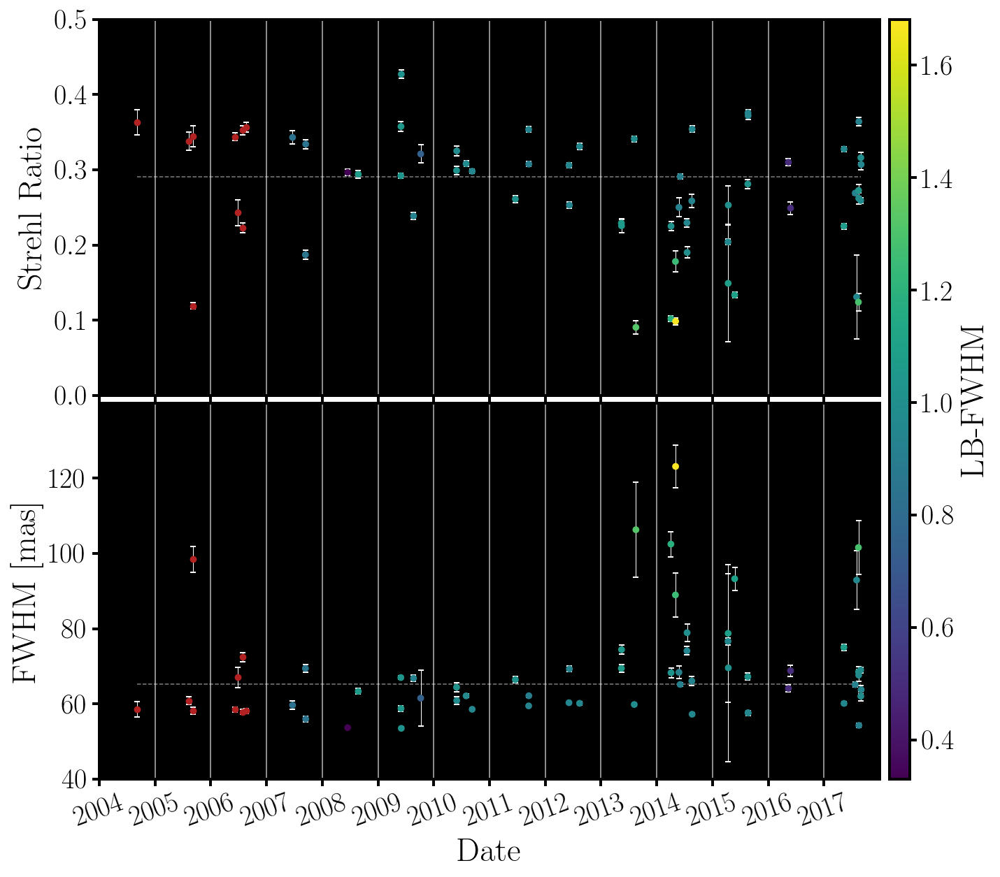

In [223]:
s_med = np.median(strehl_medians)
f_med = np.median(fwhm_medians)

fig, ax = plt.subplots(2, 1, figsize = (10,10))
plt.subplots_adjust(hspace = 0.02)

ax1 = ax[0]
ax2 = ax[1]

s = 15

# plt.figure(figsize = (12,8))
# b1, m1 = np.polynomial.polynomial.polyfit(days, strehl_medians, deg=1, rcond=None, full=False, w=np.reciprocal(strehl_err))
fit1 = [s_med for x in days]
ax1.plot(days, fit1, color = 'w', linestyle = '--', linewidth = 0.75, alpha = 0.5)
i = ax1.scatter(days, strehl_medians, c = lbfwhm, s = s, zorder = 100)
ax1.scatter(days[:9], strehl_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax1.scatter
ax1.errorbar(x = days, y = strehl_medians, yerr = strehl_err, fmt = '', ls = '', ecolor = 'w', capsize = 2, elinewidth = 0.5, zorder = 0)
ax1.set_ylabel('Strehl Ratio')

ax1.set_xticks(np.arange(0, 164, 12))
ax1.set_xticklabels([])
ax1.xaxis.grid(True, which='major')
ax1.set_xlim(0,168)
ax1.set_ylim(0,0.5)
ax1.set_facecolor('k')



# ax2 = ax.twinx()
# b2, m2 = np.polynomial.polynomial.polyfit(days, fwhm_medians, deg=1, rcond=None, full=False, w=np.reciprocal(FWHM_err))
fit2 = [f_med for x in days]
ax2.plot(days, fit2, color = 'w', linestyle = '--', linewidth = 0.75, alpha = 0.5)
ax2.scatter(days, fwhm_medians, c = lbfwhm, s = s, zorder = 100)
ax2.scatter(days[:9], fwhm_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax2.errorbar(x = days, y = fwhm_medians, yerr = fwhm_err, fmt = '', ls = '', ecolor = 'w', capsize = 2, elinewidth = 0.5, zorder = 0)
ax2.set_ylabel('FWHM [mas]')
ax2.set_xlabel('Date')
ax2.set_xlim(0,168)
ax2.set_ylim(40,140)
ax2.set_yticks([40,60,80,100,120])
ax2.set_facecolor('k')

ax2.grid(axis = 'x')
plt.xticks(np.arange(0, 164, 12), np.arange(2004,2018), rotation = 20)
# plt.yticks(fontsize = 14)

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'LB-FWHM')
# plt.title('Median Strehl Ratio over Time', fontsize = 20)
# plt.savefig('Medians.pdf', format = 'pdf')
# print(m1,b1)
plt.show()

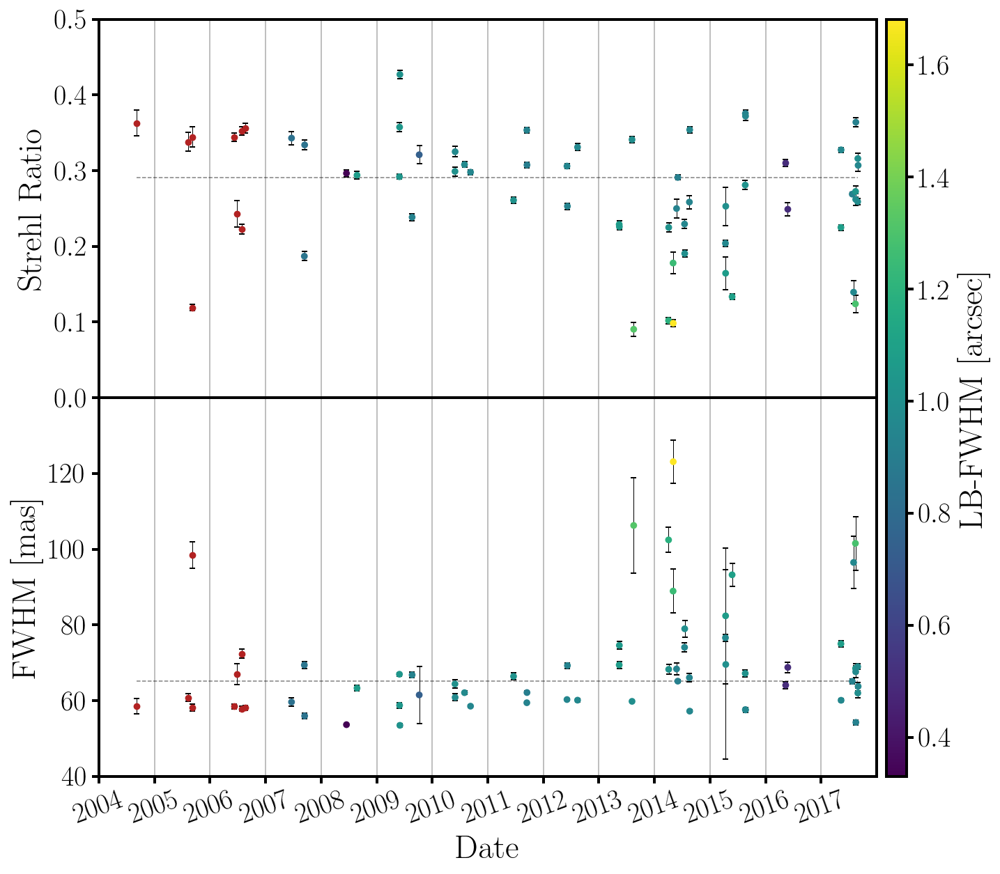

In [273]:
s_med = np.median(strehl_medians)
f_med = np.median(fwhm_medians)

fig, ax = plt.subplots(2, 1, figsize = (10,10))
plt.subplots_adjust(hspace = 0)

ax1 = ax[0]
ax2 = ax[1]

s = 15

# plt.figure(figsize = (12,8))
# b1, m1 = np.polynomial.polynomial.polyfit(days, strehl_medians, deg=1, rcond=None, full=False, w=np.reciprocal(strehl_err))
fit1 = [s_med for x in days]
ax1.plot(days, fit1, color = 'k', linestyle = '--', linewidth = 0.75, alpha = 0.5)
i = ax1.scatter(days, strehl_medians, c = lbfwhm, s = s, zorder = 100)
j = ax1.scatter(days[:9], strehl_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax1.scatter
ax1.errorbar(x = days, y = strehl_medians, yerr = strehl_err, fmt = '', ls = '', ecolor = 'k', capsize = 2, elinewidth = 0.5, zorder = 0)
ax1.set_ylabel('Strehl Ratio')

ax1.set_xticks(np.arange(0, 164, 12))
ax1.set_xticklabels([])
ax1.xaxis.grid(True, which='major')
ax1.set_xlim(0,168)
ax1.set_ylim(0,0.5)
# ax1.set_facecolor('#EAEAF2')



# ax2 = ax.twinx()
# b2, m2 = np.polynomial.polynomial.polyfit(days, fwhm_medians, deg=1, rcond=None, full=False, w=np.reciprocal(FWHM_err))
fit2 = [f_med for x in days]
ax2.plot(days, fit2, color = 'k', linestyle = '--', linewidth = 0.75, alpha = 0.5)
ax2.scatter(days, fwhm_medians, c = lbfwhm, s = s, zorder = 100)
ax2.scatter(days[:9], fwhm_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax2.errorbar(x = days, y = fwhm_medians, yerr = fwhm_err, fmt = '', ls = '', ecolor = 'k', capsize = 2, elinewidth = 0.5, zorder = 0)
ax2.set_ylabel('FWHM [mas]')
ax2.set_xlabel('Date')
ax2.set_xlim(0,168)
ax2.set_ylim(40,140)
ax2.set_yticks([40,60,80,100,120])
# ax2.set_facecolor('#EAEAF2')

ax2.grid(axis = 'x')
plt.xticks(np.arange(0, 164, 12), np.arange(2004,2018), rotation = 20)
# plt.yticks(fontsize = 14)

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'LB-FWHM [arcsec]')
# color_ax2 = fig.add_axes([.91, .8, 0.02, 0.025])
# plt.colorbar(j, cax = color_ax2)
# plt.title('Median Strehl Ratio over Time', fontsize = 20)
plt.savefig('Medians_lbfwhm.pdf', format = 'pdf', bbox_inches='tight')
# print(m1,b1)
plt.show()

In [267]:
dimm_mean

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

In [ ]:
s_med = np.median(strehl_medians)
f_med = np.median(fwhm_medians)

fig, ax = plt.subplots(2, 1, figsize = (10,10))
plt.subplots_adjust(hspace = 0)

ax1 = ax[0]
ax2 = ax[1]

s = 15

# plt.figure(figsize = (12,8))
# b1, m1 = np.polynomial.polynomial.polyfit(days, strehl_medians, deg=1, rcond=None, full=False, w=np.reciprocal(strehl_err))
fit1 = [s_med for x in days]
ax1.plot(days, fit1, color = 'k', linestyle = '--', linewidth = 0.75, alpha = 0.5)
i = ax1.scatter(days, strehl_medians, c = dimm_mean, s = s, zorder = 100)
j = ax1.scatter(days[:9], strehl_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax1.scatter
ax1.errorbar(x = days, y = strehl_medians, yerr = strehl_err, fmt = '', ls = '', ecolor = 'k', capsize = 2, elinewidth = 0.5, zorder = 0)
ax1.set_ylabel('Strehl Ratio')

ax1.set_xticks(np.arange(0, 164, 12))
ax1.set_xticklabels([])
ax1.xaxis.grid(True, which='major')
ax1.set_xlim(0,168)
ax1.set_ylim(0,0.5)
# ax1.set_facecolor('#EAEAF2')



# ax2 = ax.twinx()
# b2, m2 = np.polynomial.polynomial.polyfit(days, fwhm_medians, deg=1, rcond=None, full=False, w=np.reciprocal(FWHM_err))
fit2 = [f_med for x in days]
ax2.plot(days, fit2, color = 'k', linestyle = '--', linewidth = 0.75, alpha = 0.5)
ax2.scatter(days, fwhm_medians, c = dimm_mean, s = s, zorder = 100)
ax2.scatter(days[:9], fwhm_medians[:9], c = 'firebrick', s = s, zorder = 100)
ax2.errorbar(x = days, y = fwhm_medians, yerr = fwhm_err, fmt = '', ls = '', ecolor = 'k', capsize = 2, elinewidth = 0.5, zorder = 0)
ax2.set_ylabel('FWHM [mas]')
ax2.set_xlabel('Date')
ax2.set_xlim(0,168)
ax2.set_ylim(40,140)
ax2.set_yticks([40,60,80,100,120])
# ax2.set_facecolor('#EAEAF2')

ax2.grid(axis = 'x')
plt.xticks(np.arange(0, 164, 12), np.arange(2004,2018), rotation = 20)
# plt.yticks(fontsize = 14)

color_ax = fig.add_axes([.91, .125, 0.02, 0.755])
plt.colorbar(i, cax = color_ax, label = 'LB-FWHM')
# color_ax2 = fig.add_axes([.91, .8, 0.02, 0.025])
# plt.colorbar(j, cax = color_ax2)
# plt.title('Median Strehl Ratio over Time', fontsize = 20)
plt.savefig('Medians_dimm.pdf', format = 'pdf')
# print(m1,b1)
plt.show()

### Testing the Maréchal approximation:

/anaconda/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


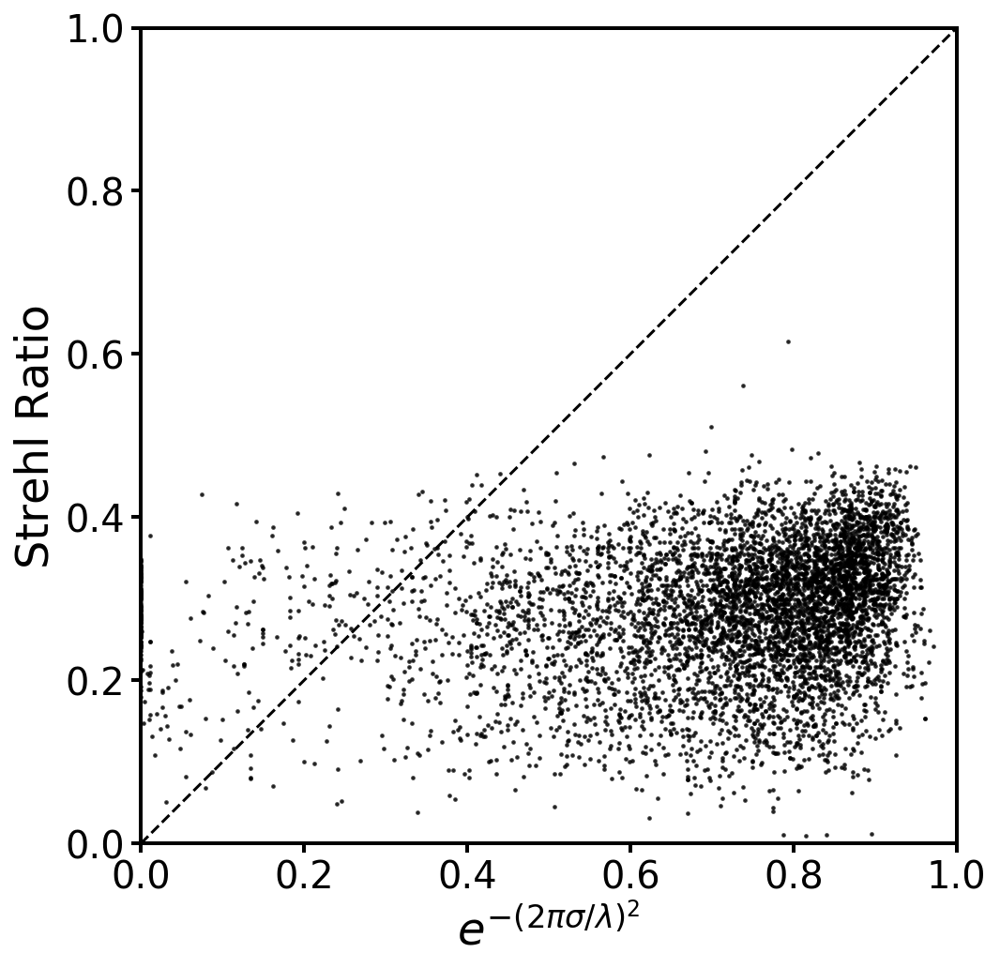

In [150]:
pi = np.pi
wavelength = 2124.5 * u.nm
df['sigma'] = df['lgrmswf'] * 2 * pi / wavelength

lim = len(df)
x = np.exp(-(df['sigma'][:lim]**2))
y = df['strehl'][:lim]
c = 'k' #df['lsamppwr']

model = np.linspace(0,1,100)

plt.figure(figsize = (8,8))
plt.scatter(x, y, c = c, s = 2, alpha = 0.7)
plt.plot(model,model, c = 'k', linestyle = '--')
plt.axis('scaled')
plt.ylim(0,1)
plt.xlim(0,1)
plt.xlabel('$e^{-(2 \pi \sigma / \lambda)^2}$')
plt.ylabel('Strehl Ratio')
plt.show()

In [43]:
def plot(param1, param2, count):

    fig, ax = plt.subplots(2,1, figsize = (6,10))
    plt.subplots_adjust(hspace = 0)

    ax1 = ax[0]
    ax2 = ax[1]
    
    

    x = df[param1]
    c = df[param2]

    y1 = df['fwhm']
    y2 = df['strehl']

    ax1.scatter(x1, y1, s = 0.5, c = 'k')
    # ax1.set_xlim(50,650)
    ax1.set_xticks([])
    ax1.set_ylim(45,130)
    ax1.set_ylabel('FWHM [milliarcsec]')

    ax2.scatter(x1, y2, s = 0.5, c = 'k')
    ax2.set_ylim(0,0.5)
    # ax2.set_xlim(50,650)
    # ax2.set_xticks([0,300,600])
    ax2.set_ylabel('Strehl Ratio')
    ax2.set_xlabel(param1)
    
    cbar = plt.colorbar(c)
    cbar.set_label(str(param2))
    
#     plt.savefig('Bulk_Images/' + count + '.pdf', format = 'pdf')

    plt.show()

In [157]:
rcParams["text.usetex"]= True
def plotter(param1, param2, count):
    x = df[param1]
    c = df[param2]
    y = df['fwhm']
    
    plt.figure(figsize = (8,6))
    plt.scatter(x, y, s = 2, c = np.log(c))
    plt.ylim(45,130)
    plt.ylabel('FWHM [milliarcsec]')
    plt.xlabel(param1.replace('_', ''))
    cbar = plt.colorbar()
    cbar.set_label('log(%s)' % param2.replace('_', ''))
    plt.savefig('Bulk_Images/' + param1 + '_c_' + param2 + '.pdf', format = 'pdf')
#     plt.show()

In [158]:
bad = ['file', 'strehl', 'fwhm', 'epoch', 'band', 'wind_speed[kts]', 'pressure[mb]', 'mjd', 'DIMM_mjd', 'MASS_mjd', 'MASSPRO_mjd', 'cfht_mjd', 'DIMM_delta_t', 'MASS_delta_t', 'MASSPRO_delta_t', 'cfht_delta_t', 'MASSPRO_half', 'MASSPRO_1', 'MASSPRO_2', 'MASSPRO_4', 'MASSPRO_8', 'MASSPRO_16']
count = 1
for parameter in df.columns:
    if parameter not in bad:
        param1 = parameter
        for other in df.columns:
            if other not in bad and other != param1:
                param2 = other
                plotter(param1, param2, count)
                count += 1

/anaconda/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log
  import sys
/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


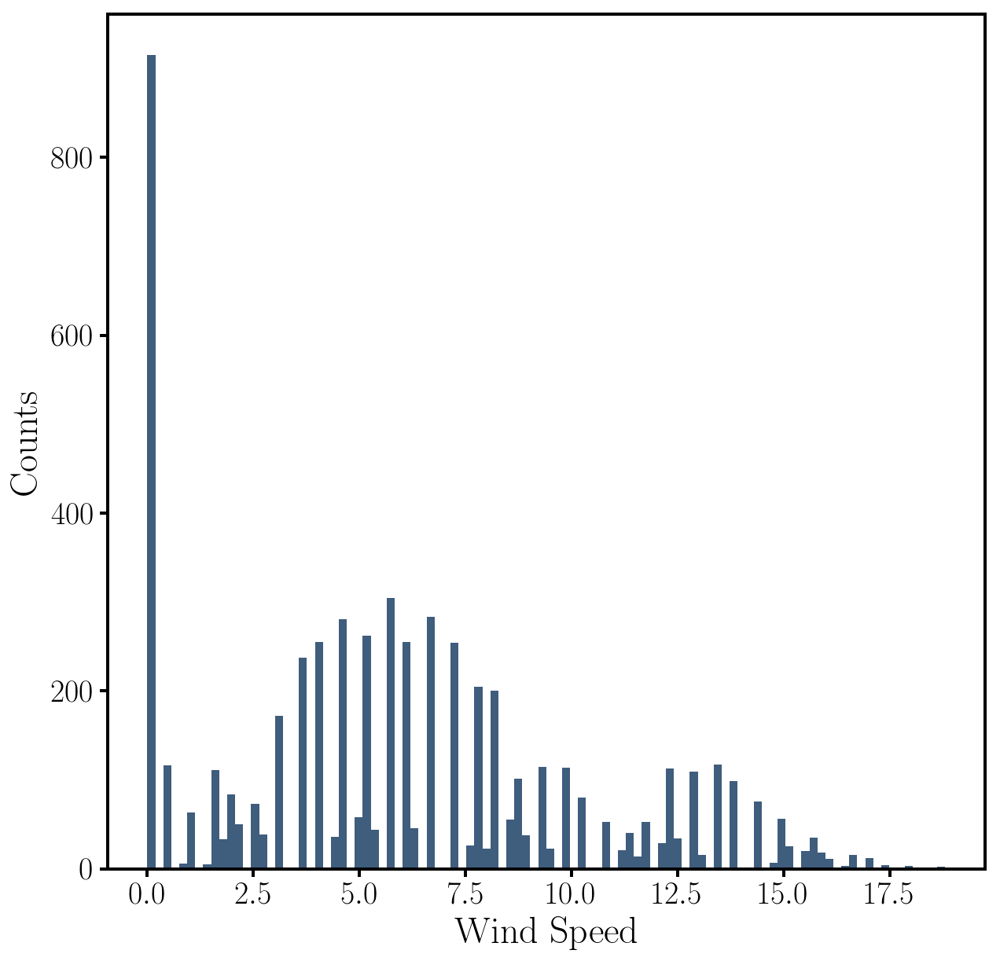

In [202]:
color = '#3F5D7D'
plt.figure(figsize = (10,10))
plt.hist(df['wind_speed'], bins=100, color = color)
plt.xlabel('Wind Speed')
plt.ylabel('Counts')
plt.show()

In [27]:
df_good['pressure'].min()

0.6119

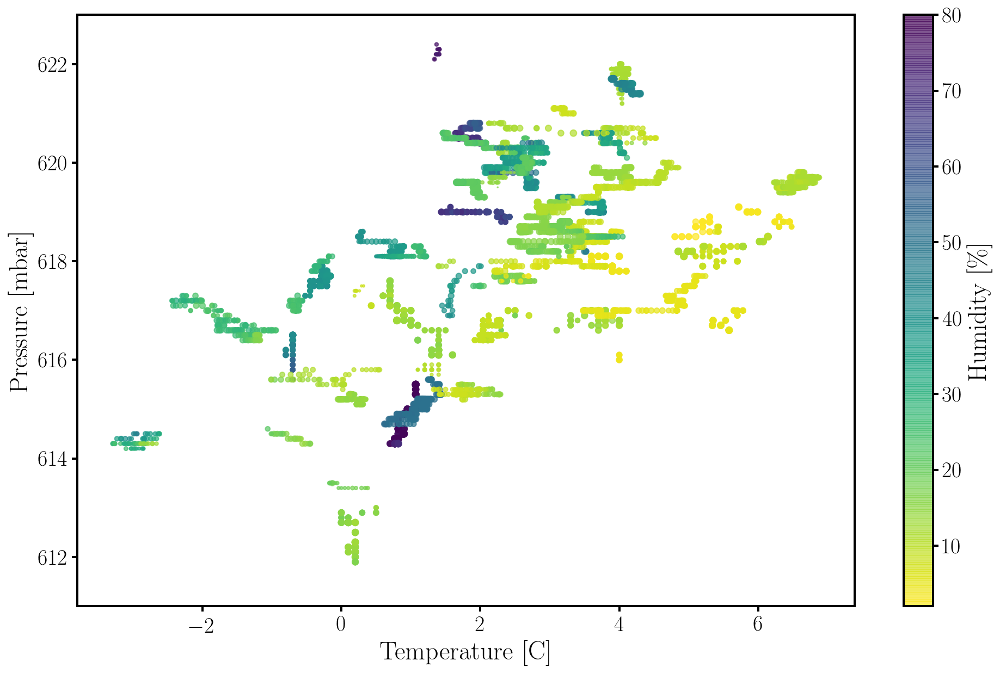

In [59]:
plt.figure(figsize = (16,10))
plt.scatter(df_good['temperature'], df_good['pressure[mb]'], c = df_good['relative_humidity'], s = 100000 / (df_good['fwhm']**2), cmap = 'viridis_r', alpha = 0.7) #, c = np.log(df_good['fwhm']), cmap = 'viridis_r')#s = 100000 / (df_good['fwhm']**2), c = df_good['pressure[mb]'])
plt.xlabel('Temperature [C]')
plt.ylabel('Pressure [mbar]')
plt.ylim(611,623)
cbar = plt.colorbar()
cbar.set_label('Humidity [\%]')
plt.show()

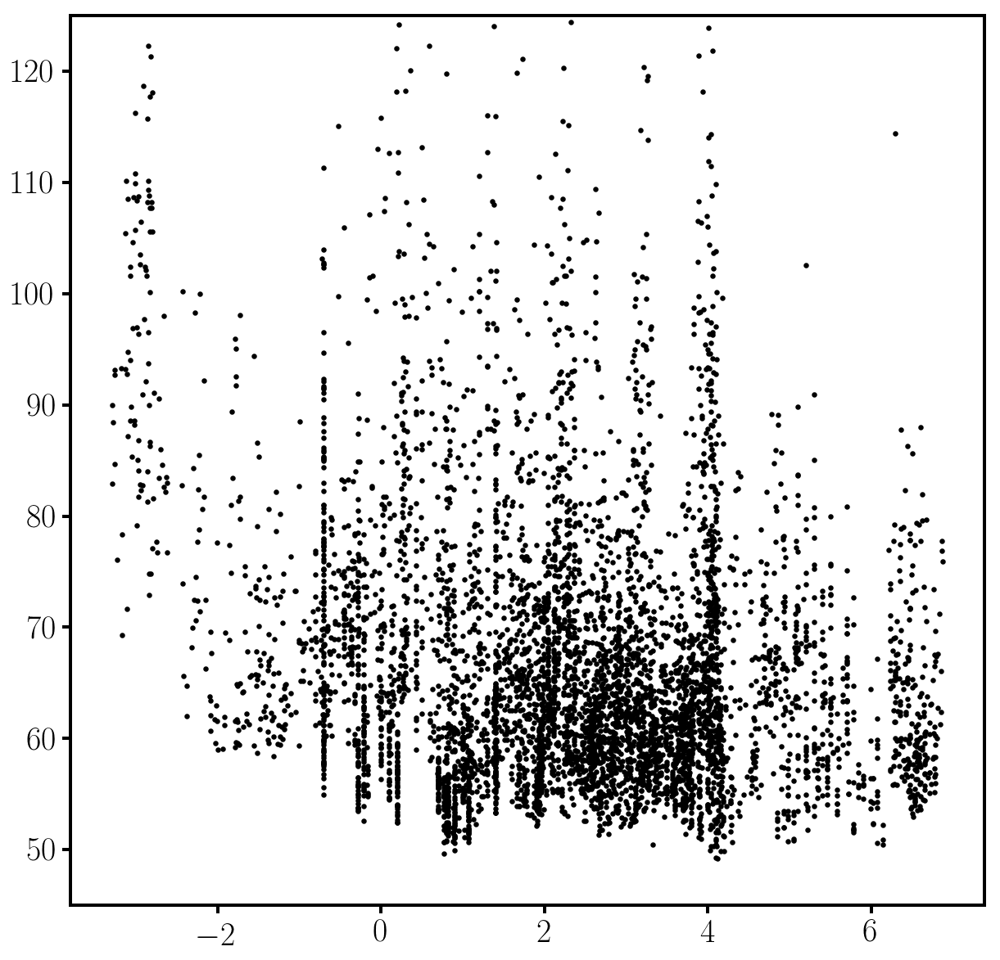

In [64]:
plt.figure(figsize = (10,10))
plt.scatter(df_good['temperature'], df_good['fwhm'], c = 'k', s = 5)
plt.ylim(45,125)
plt.show()

In [21]:
df_new = df
df_new = df_new.drop(['file', 'epoch', 'band', 'wind_speed[kts]', 'pressure[mb]', 'mjd', 'DIMM_mjd', 'MASS_mjd', 'MASSPRO_mjd', 'cfht_mjd', 'DIMM_delta_t', 'MASS_delta_t', 'MASSPRO_delta_t', 'cfht_delta_t', 'MASSPRO_half', 'MASSPRO_1', 'MASSPRO_2', 'MASSPRO_4', 'MASSPRO_8', 'MASSPRO_16'], axis = 1)

/anaconda/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


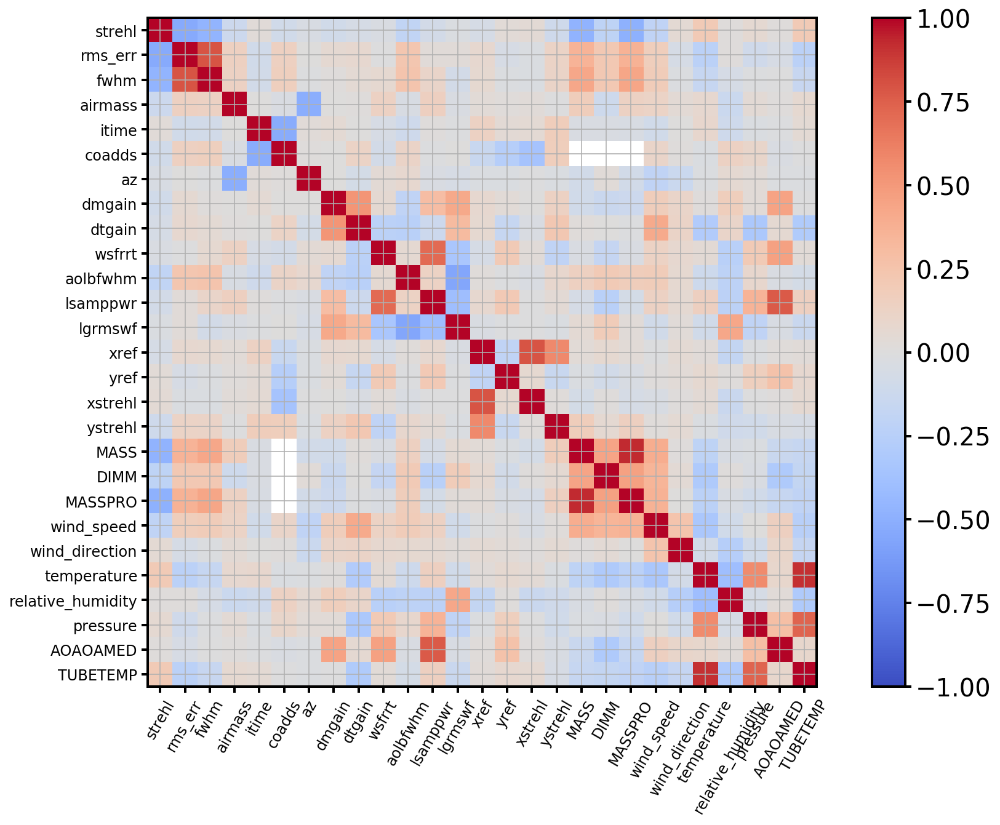

In [24]:
rcParams["text.usetex"]= False
def correlation_matrix(df_new):
    from matplotlib import cm

    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('coolwarm')
    cax = ax1.imshow(df_new.corr(), interpolation="nearest", cmap=cmap, vmin = -1)
    ax1.grid(True)
#     plt.title('Feature Correlation')
    labels = df_new.columns
    ax1.set_xticks(range(len(labels)))
    ax1.set_yticks(range(len(labels)))
    ax1.set_xticklabels(labels,fontsize=12,rotation=60)
    ax1.set_yticklabels(labels,fontsize=12)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax)
    plt.savefig('correlation.pdf', format = 'pdf')
    plt.show()

correlation_matrix(df_new)

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in log
  
/anaconda/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


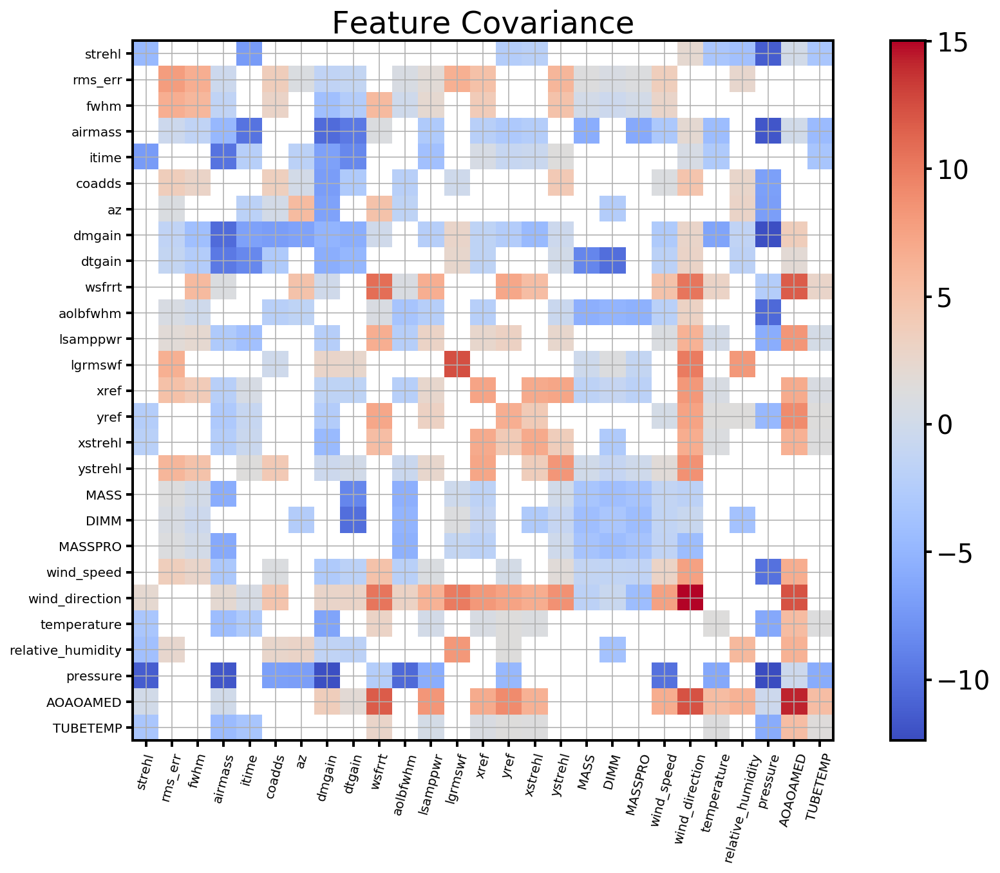

In [25]:
rcParams["text.usetex"]= False
def cov_matrix(df_new):
    from matplotlib import cm

    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('coolwarm')
    cax = ax1.imshow(np.log(df_new.cov()), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    plt.title('Feature Covariance')
    labels = df_new.columns
    ax1.set_xticks(range(len(labels)))
    ax1.set_yticks(range(len(labels)))
    ax1.set_xticklabels(labels,fontsize=10,rotation=75)
    ax1.set_yticklabels(labels,fontsize=10)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax)
    plt.show()

cov_matrix(df_new)

In [30]:
df['xstrehl'].mean()

528.9201474197342

In [31]:
df['ystrehl'].mean()

412.6254178853583

In [32]:
df['fwhm'].max()

442.63

In [32]:
cols = 'file', 'mjd'
df2 = df.loc[:,cols]

In [23]:
df2.head()

,file,mjd
0,c0077.fits,53212.34642
1,c0078.fits,53212.34720
2,c0079.fits,53212.34830
3,c0080.fits,53212.34860
4,c0081.fits,53212.34923


In [33]:
times = Time(df.mjd, format = 'mjd')
df2['UTC'] = times.iso

In [31]:
times[0].iso

'2004-07-26 08:18:50.688'

In [34]:
df2.head()

,file,mjd,UTC
0,c0077.fits,53212.34642,2004-07-26 08:18:50.688
1,c0078.fits,53212.34720,2004-07-26 08:19:58.080
2,c0079.fits,53212.34830,2004-07-26 08:21:33.120
3,c0080.fits,53212.34860,2004-07-26 08:21:59.040
4,c0081.fits,53212.34923,2004-07-26 08:22:53.472


In [114]:
df2.to_csv('nirc2_frames.txt', index=None, sep=' ')

In [170]:
print(df['aolbfwhm'].min())

0.205913


In [178]:
min_val = df['wind_speed'].min()
count = 0
for i, row in df.iterrows():
    if row['wind_speed'] == min_val:
        count+=1
print(count)

915


In [212]:
curious = []
for i, row in df.iterrows():
    if row['aolbfwhm'] < 0.35:
        curious.append(i)
        
print(len(curious))

116


In [167]:
stuff = [0,1,2,np.nan]
print(min(stuff))

0


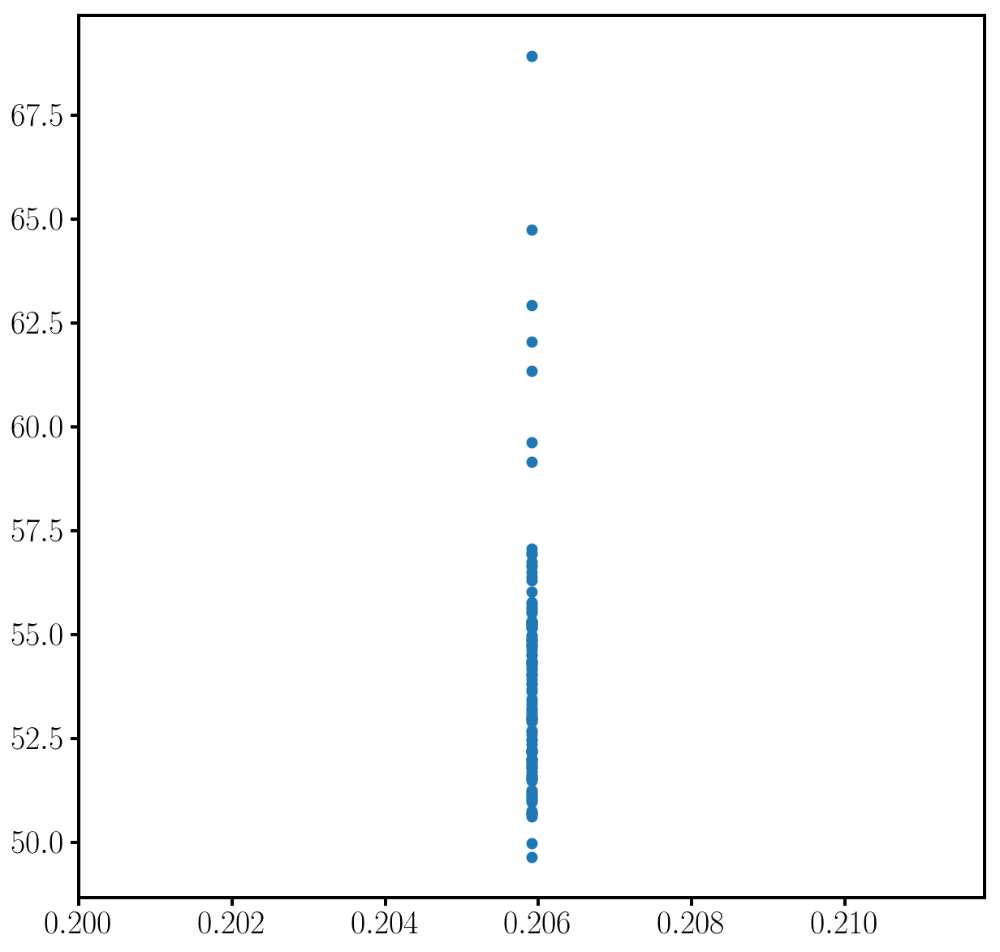

In [173]:
plt.figure(figsize = (10,10))
plt.scatter(df['aolbfwhm'][curious], df['fwhm'][curious])
plt.show()

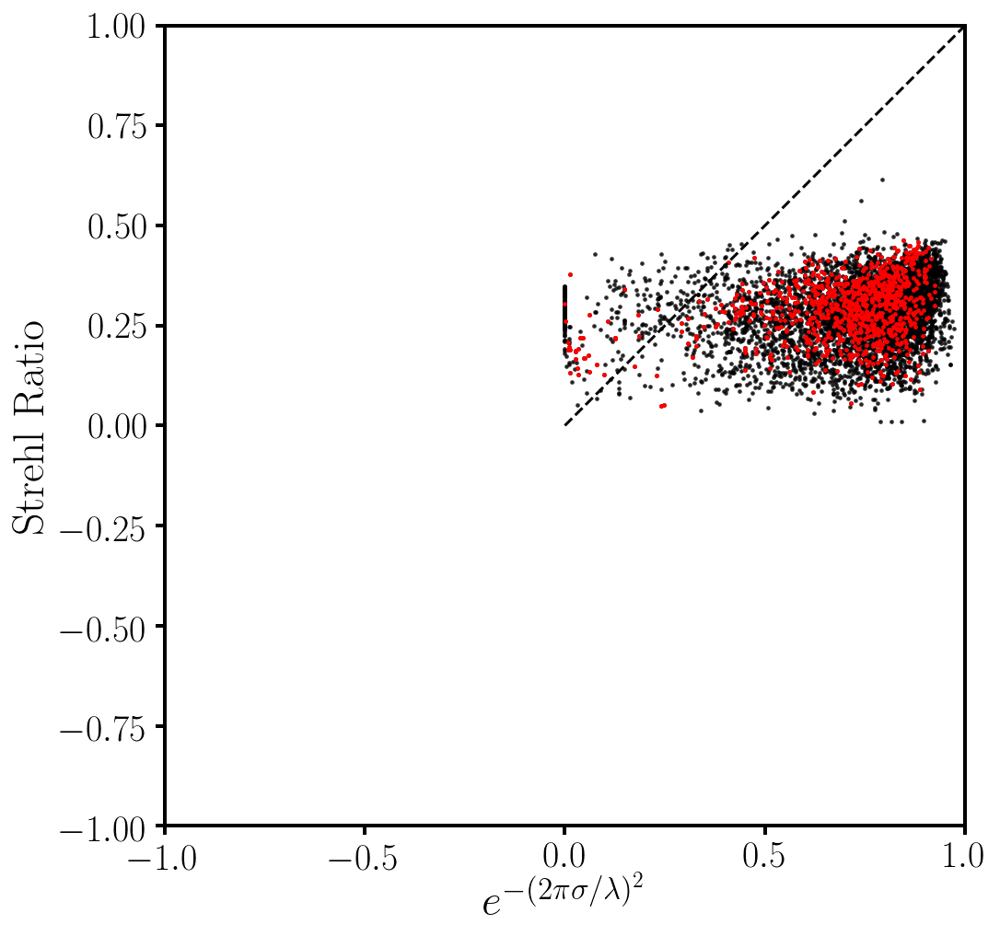

In [180]:
pi = np.pi
wavelength = 2124.5 * u.nm
df['sigma'] = df['lgrmswf'] * 2 * pi / wavelength

lim = len(df)
x = np.exp(-(df['sigma'][:lim]**2))
y = df['strehl'][:lim]
c = 'k' #df['lsamppwr']

model = np.linspace(0,1,100)

plt.figure(figsize = (8,8))
plt.scatter(x, y, c = c, s = 2, alpha = 0.7)
plt.plot(model,model, c = 'k', linestyle = '--')
plt.scatter(x[curious], y[curious], c = 'r', s = 2)
plt.axis('scaled')
plt.ylim(-1,1)
plt.xlim(-1,1)
plt.xlabel('$e^{-(2 \pi \sigma / \lambda)^2}$')
plt.ylabel('Strehl Ratio')
plt.show()

In [208]:
print(df['wind_speed[kts]'].min())

0.0


In [179]:
curious = []
for i, row in df.iterrows():
    if row['wind_speed'] == 0.0:
        curious.append(i)
        
print(len(curious))

915


In [ ]:
for i, row in df.iterrows():

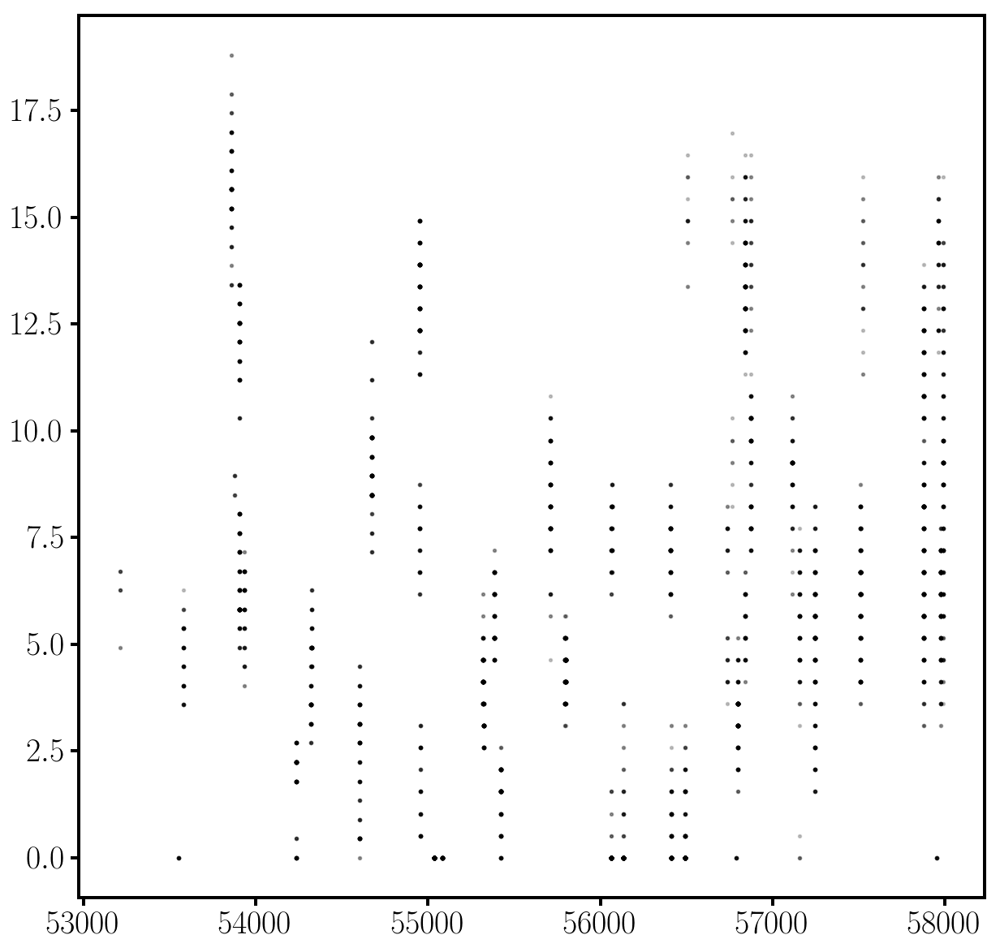

In [211]:
plt.figure(figsize = (10,10))
plt.scatter(df['mjd'], df['wind_speed'], c = 'k', s = 3, alpha = 0.2)
plt.show()